<a href="https://colab.research.google.com/github/thesis17/Afaan-Oromoo-chatGPT/blob/main/Afaan_Oromoo_of_Symptom2Disease_Using_ML%2C_DL%2C_and_BERT.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [8]:
import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)


In [9]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [10]:
data = pd.read_csv('/content/drive/MyDrive/codes/Symptom2Disease (4) (1).csv')
data

,Unnamed: 0,mallattoo itti gochuu,barreeffama
0,0,Dhukkuba psoriasis jedhamu,"Torban muraasa darbaniif harka, miilaafi qaama..."
1,1,Dhukkuba psoriasis jedhamu,"Gogaan koo keessumaa jilba, jilba koo fi gogaa..."
2,2,Dhukkuba psoriasis jedhamu,"Dhukkubbiin lafee quba, harkaa fi jilba koo ir..."
3,3,Dhukkuba psoriasis jedhamu,Gogaa koo irratti keessumaa dugdaa koo isa gad...
4,4,Dhukkuba psoriasis jedhamu,Cimdiin koo ilkaan xixiqqoo ykn boolla of kees...
...,...,...,...
1195,295,dhibee sukkaaraa,"Guutummaatti raafama, raafama. Miirri dhandham..."
1196,296,dhibee sukkaaraa,"Keessattuu caccabaa gogaa koo irratti, gogaa k..."
1197,297,dhibee sukkaaraa,Yeroo hunda fedhiin cimaan kun fi fedhiin finc...
1198,298,dhibee sukkaaraa,Keessattuu ala hafuura baafachuun na rakkina. ...


In [11]:
data['mallattoo itti gochuu'].unique()

array(['Dhukkuba psoriasis jedhamu', 'Ujummoolee dhiigaa Varicose Veins',
       'Taayifooyidii', 'Dhukkuba qamadii', 'Impetigo jedhamu',
       'Dengue jedhamu', 'Infeekshinii fangasii', 'Qorqorroo Waliigalaa',
       'Dhukkuba sombaa', 'Dhibee Hemorrhoids Dimorphic',
       'Dhukkuba Arthritis', 'Finniisa', 'Asmii Biroonkiiyaa',
       'Dhiibbaa dhiigaa', 'Dhukkuba mataa bowwoo',
       'Dhibee ispondiloosii gadameessaa',
       'Dhukkuba garaachaa (Jaundice).', 'Dhukkuba busaa',
       'infekshinii ujummoo fincaanii', 'alarjii',
       'dhukkuba gastroesophageal reflux dhukkuba garaachaa',
       'walnyaatinsa qoricha', 'dhukkuba madaa garaachaa',
       'dhibee sukkaaraa'], dtype=object)

In [12]:
data['mallattoo itti gochuu'].value_counts()

,count
mallattoo itti gochuu,
Dhukkuba psoriasis jedhamu,50
Ujummoolee dhiigaa Varicose Veins,50
Taayifooyidii,50
Dhukkuba qamadii,50
Impetigo jedhamu,50
Dengue jedhamu,50
Infeekshinii fangasii,50
Qorqorroo Waliigalaa,50
Dhukkuba sombaa,50


In [13]:
import matplotlib.pyplot as plt
import seaborn as sns
from wordcloud import WordCloud
from sklearn.feature_extraction.text import CountVectorizer, TfidfVectorizer
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE
from sklearn.cluster import KMeans
from sklearn.feature_selection import chi2
from sklearn.preprocessing import LabelEncoder
import plotly.express as px
from collections import Counter
import nltk
from nltk.corpus import stopwords
from itertools import chain
import warnings
warnings.filterwarnings("ignore")

nltk.download('stopwords')
stop_words = set(stopwords.words('english'))

[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Unzipping corpora/stopwords.zip.


In [14]:
le = LabelEncoder()
data['mallattoo itti gochuu_enc'] = le.fit_transform(data['mallattoo itti gochuu'])
class_names = le.classes_

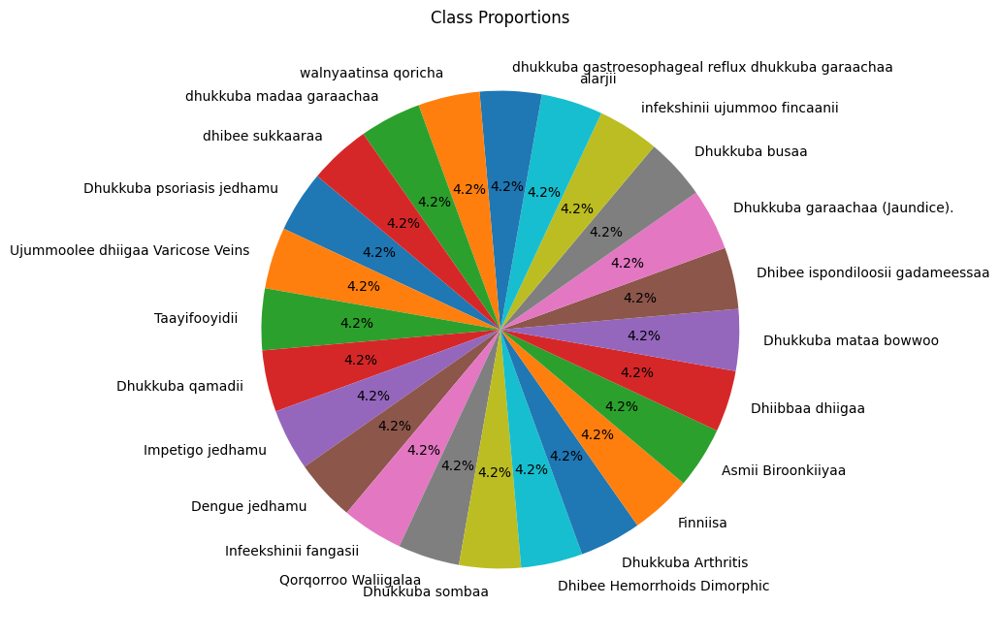

In [15]:
plt.figure(figsize=(8,8))
data['mallattoo itti gochuu'].value_counts().plot.pie(autopct='%1.1f%%', startangle=140)
plt.title("Class Proportions")
plt.ylabel("")
plt.show()

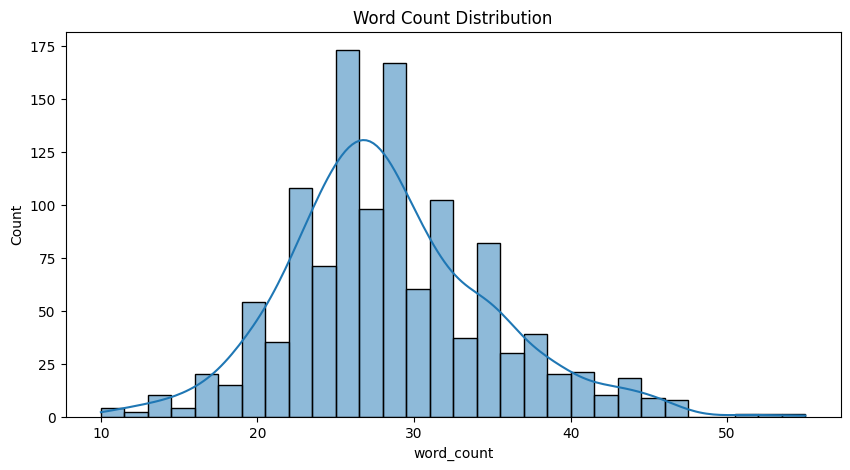

In [16]:
data['word_count'] = data['barreeffama'].apply(lambda x: len(str(x).split()))
plt.figure(figsize=(10,5))
sns.histplot(data['word_count'], bins=30, kde=True)
plt.title("Word Count Distribution")
plt.show()

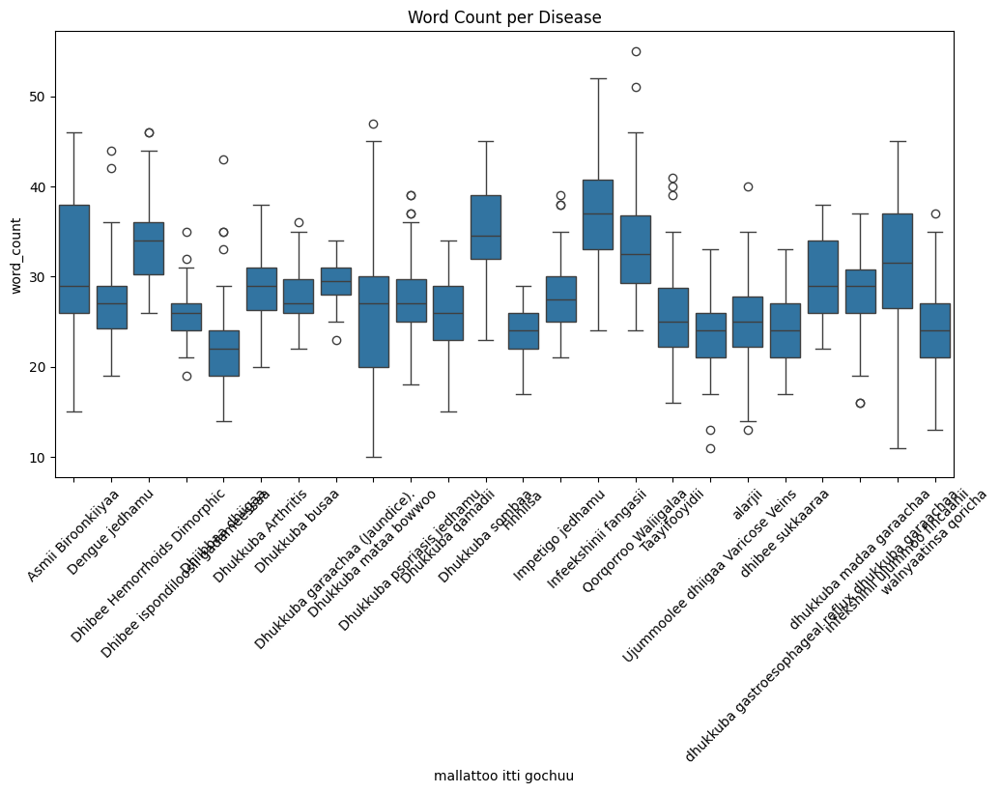

In [17]:
plt.figure(figsize=(12,6))
sns.boxplot(x='mallattoo itti gochuu', y='word_count', data=data, order=class_names)
plt.title("Word Count per Disease")
plt.xticks(rotation=45)
plt.show()

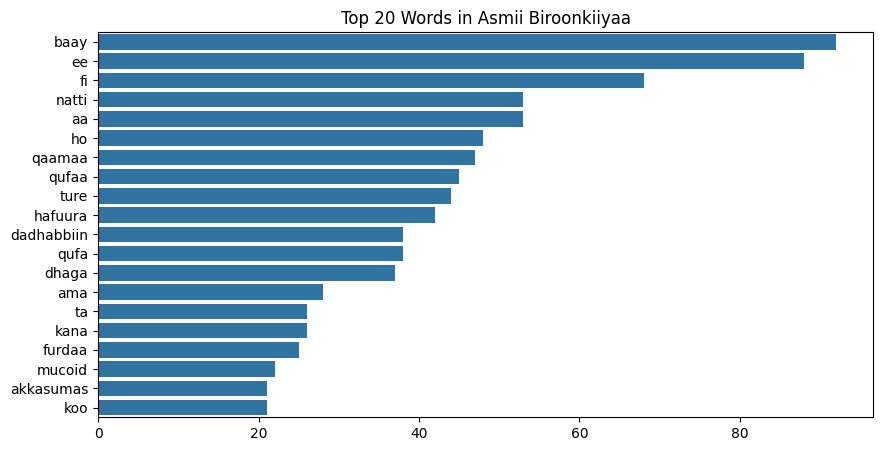

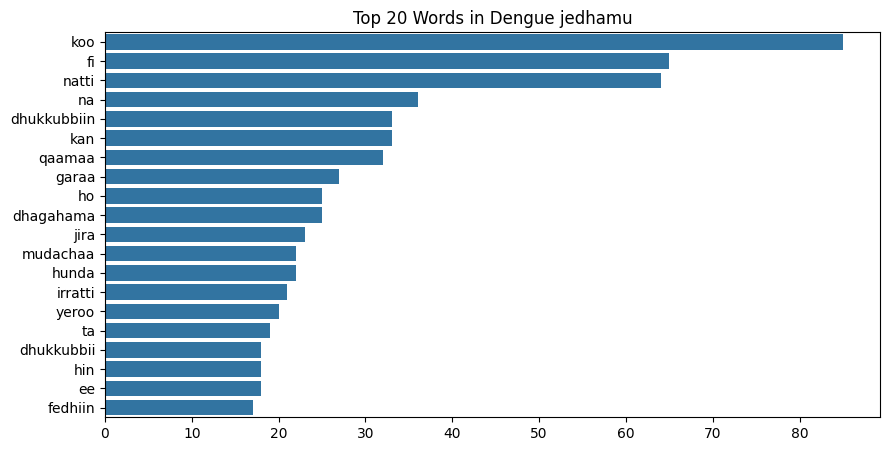

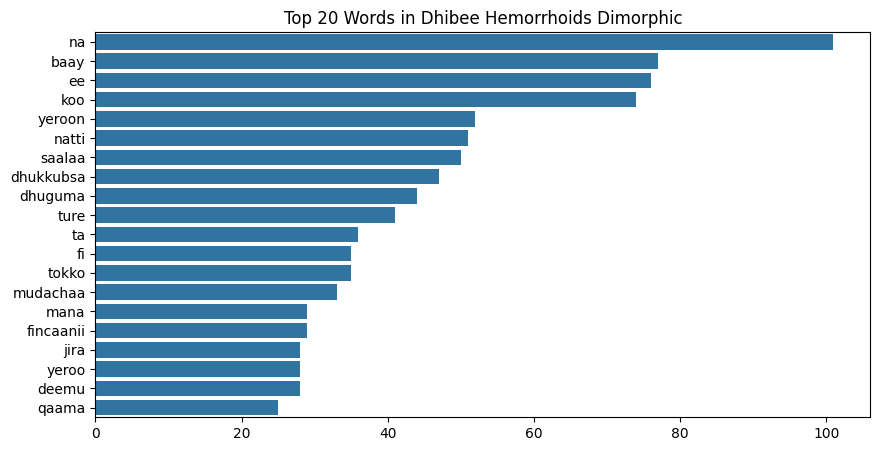

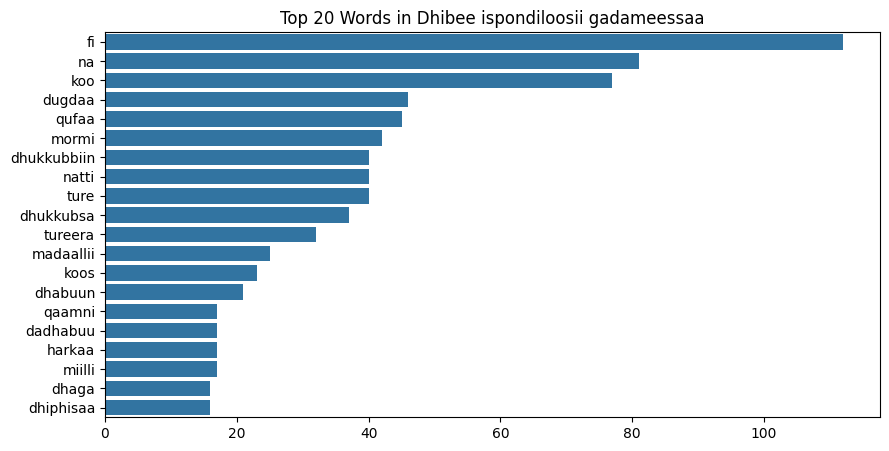

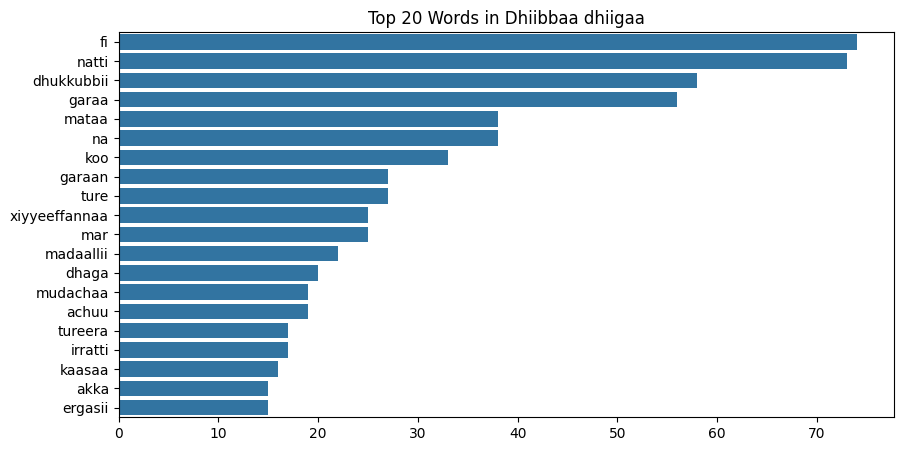

...

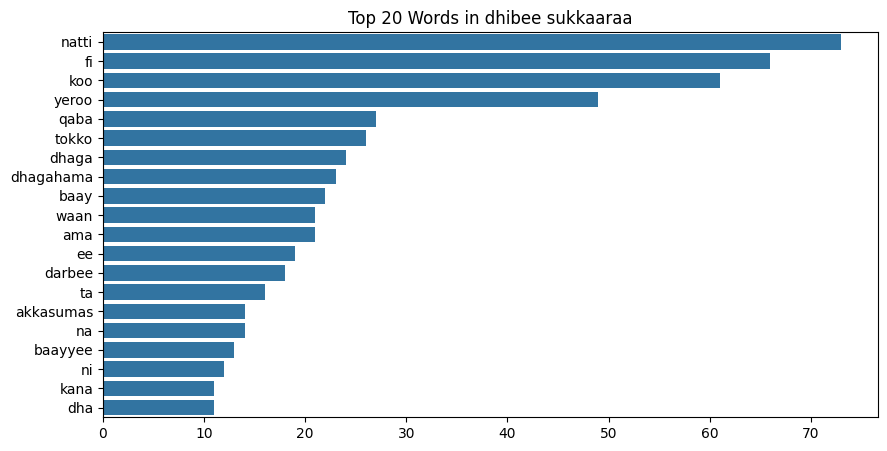

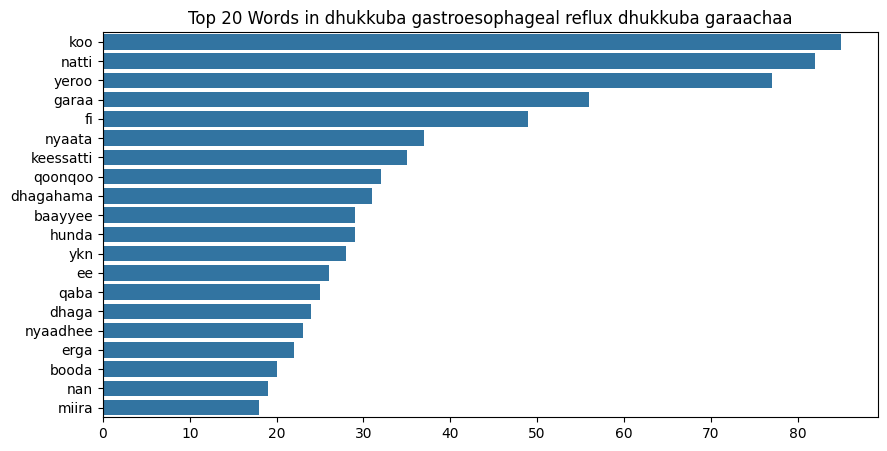

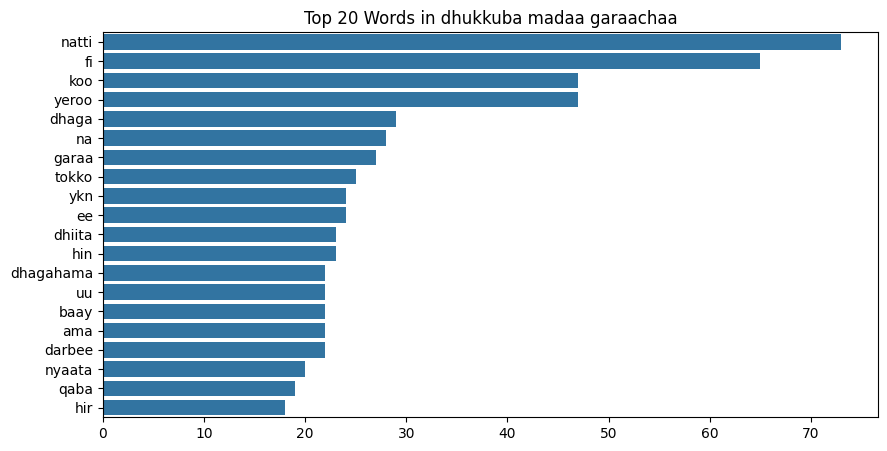

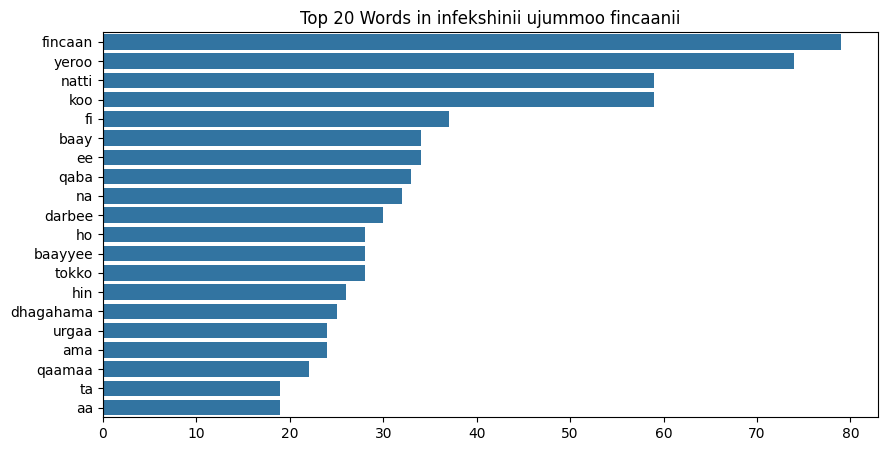

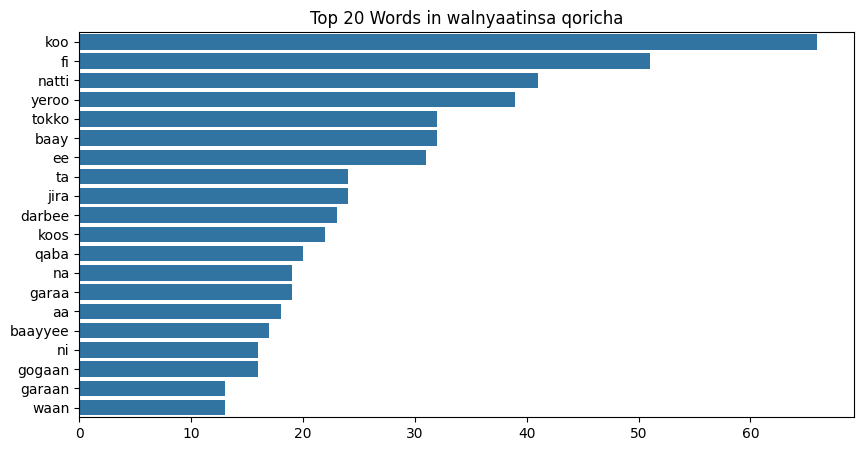

In [18]:
vectorizer = CountVectorizer(stop_words='english')
for cls in class_names:
    texts = data[data['mallattoo itti gochuu']==cls]['barreeffama']
    X = vectorizer.fit_transform(texts)
    sum_words = X.sum(axis=0)
    words_freq = [(word, sum_words[0, idx]) for word, idx in vectorizer.vocabulary_.items()]
    words_freq = sorted(words_freq, key = lambda x: x[1], reverse=True)[:20]

    words, freq = zip(*words_freq)
    plt.figure(figsize=(10,5))
    sns.barplot(x=list(freq), y=list(words))
    plt.title(f"Top 20 Words in {cls}")
    plt.show()

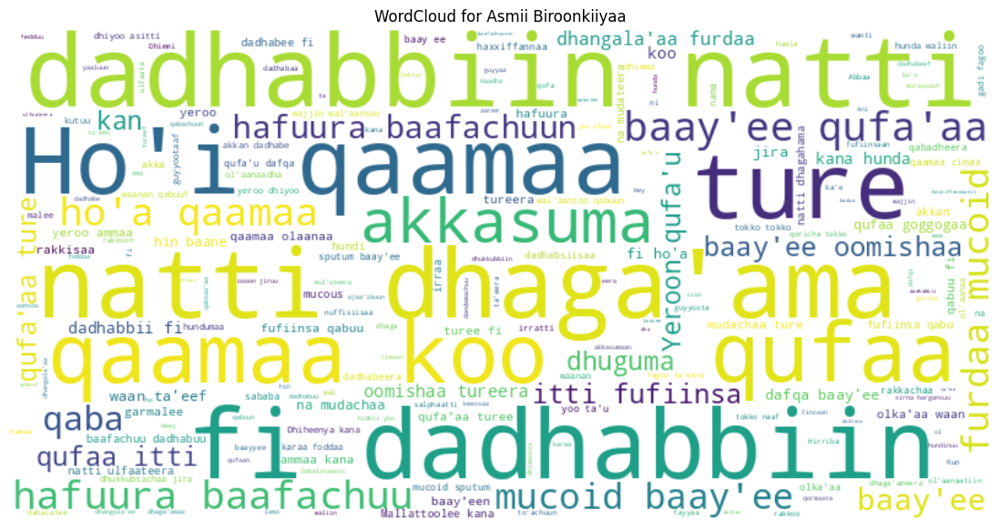

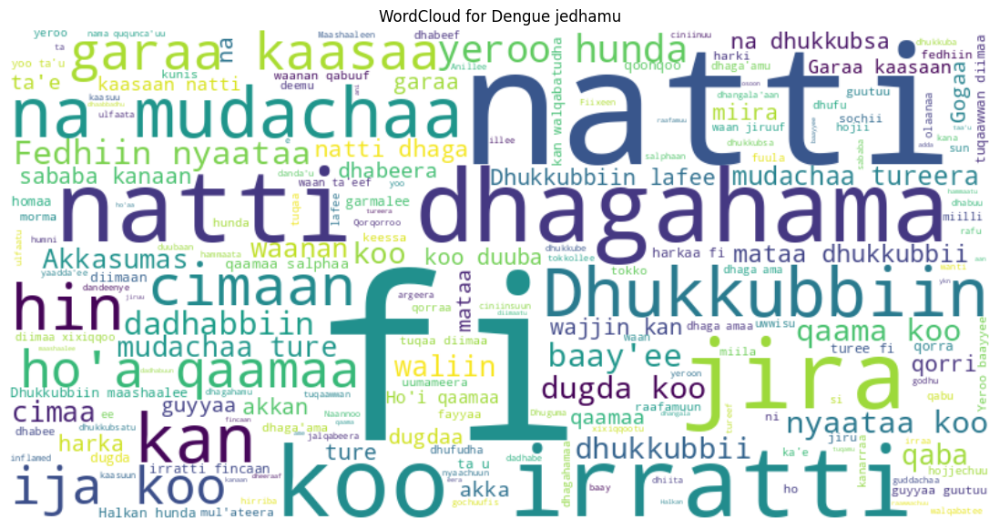

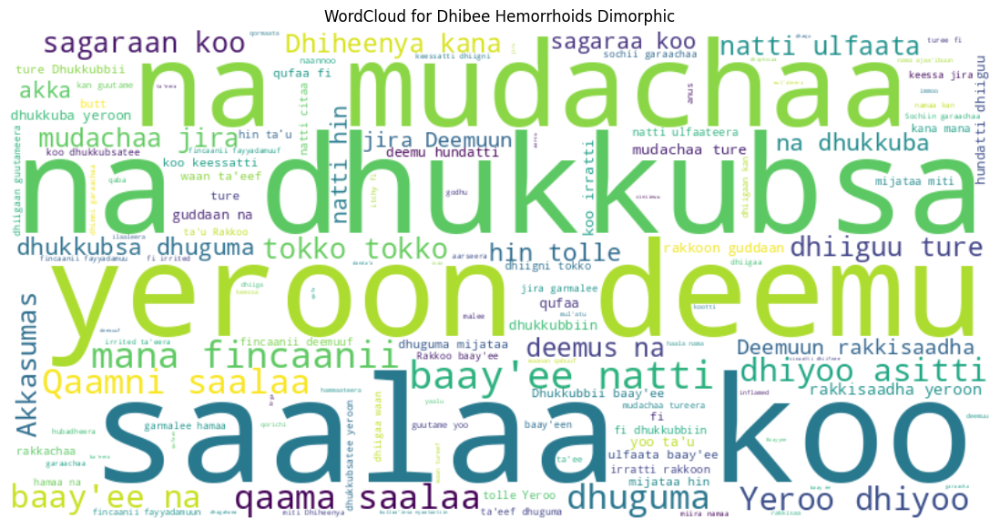

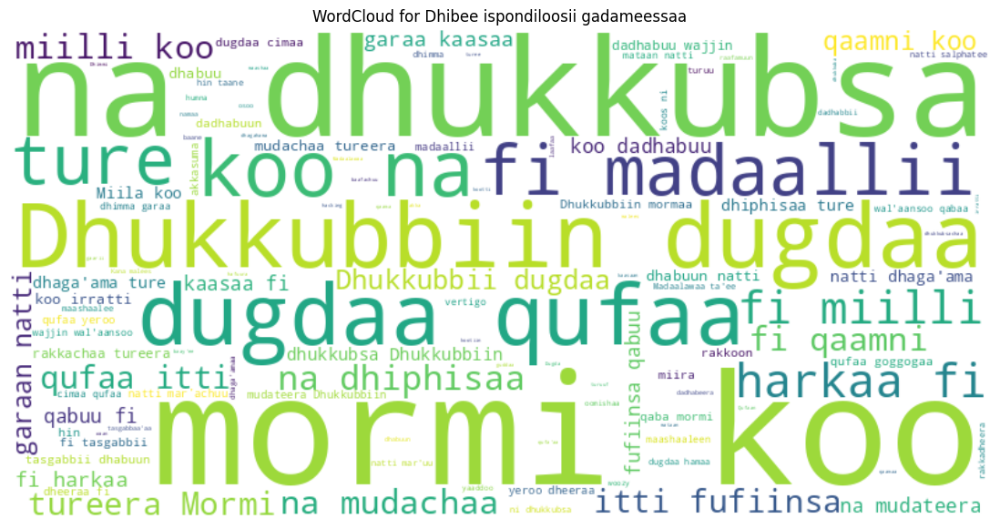

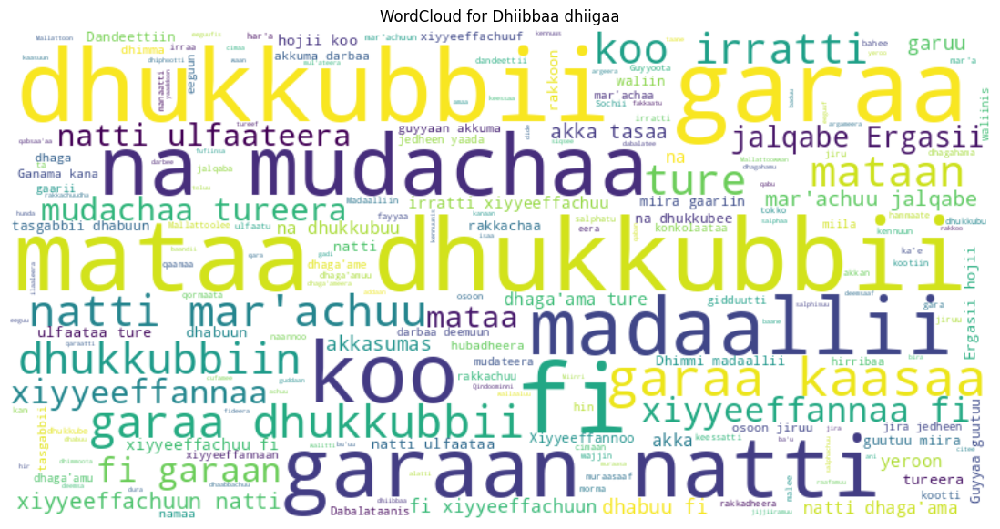

...

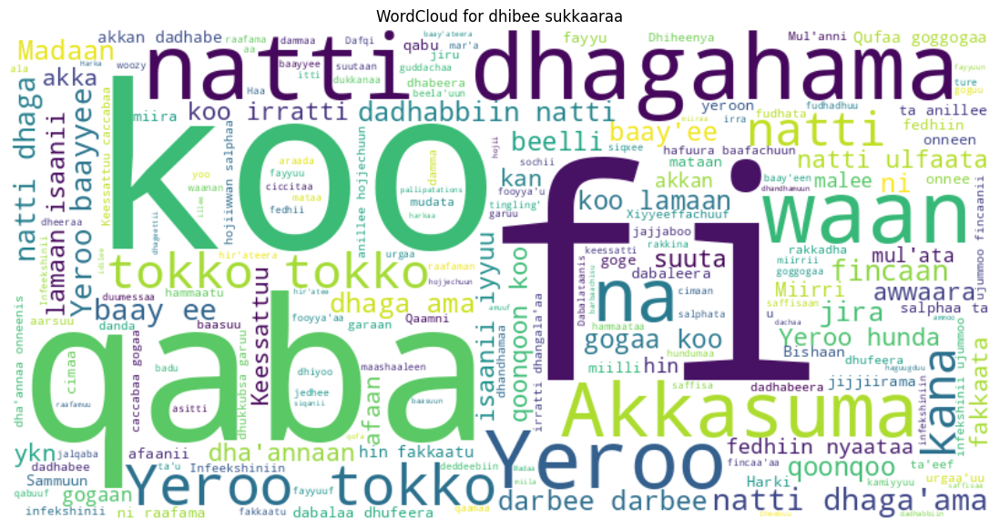

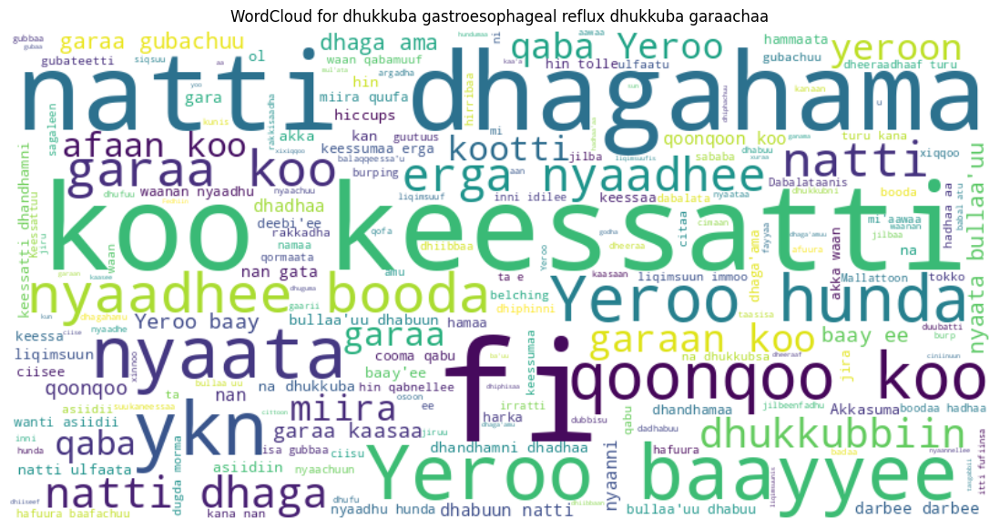

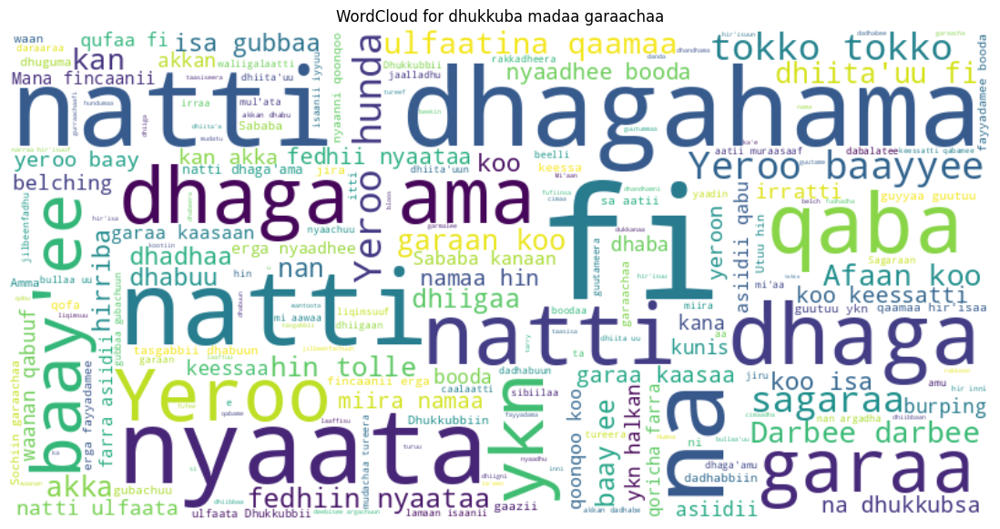

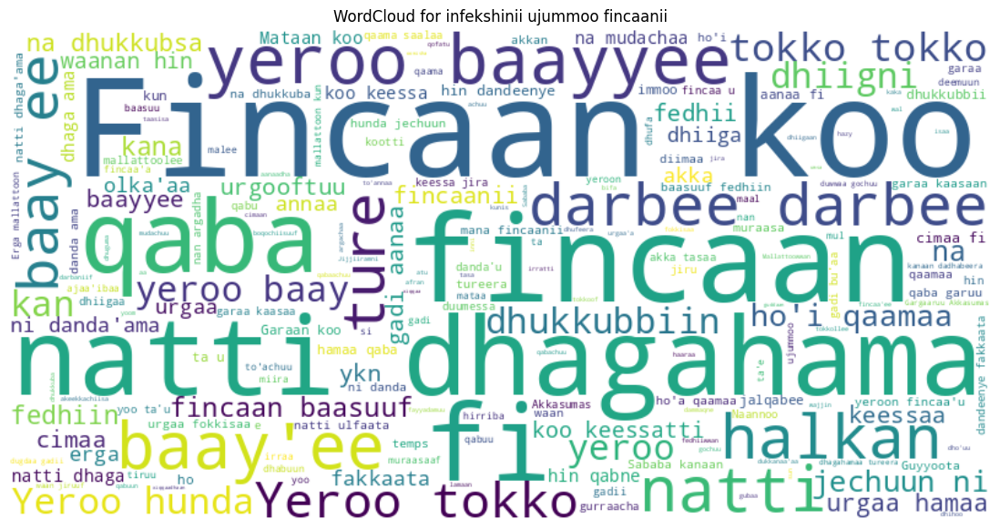

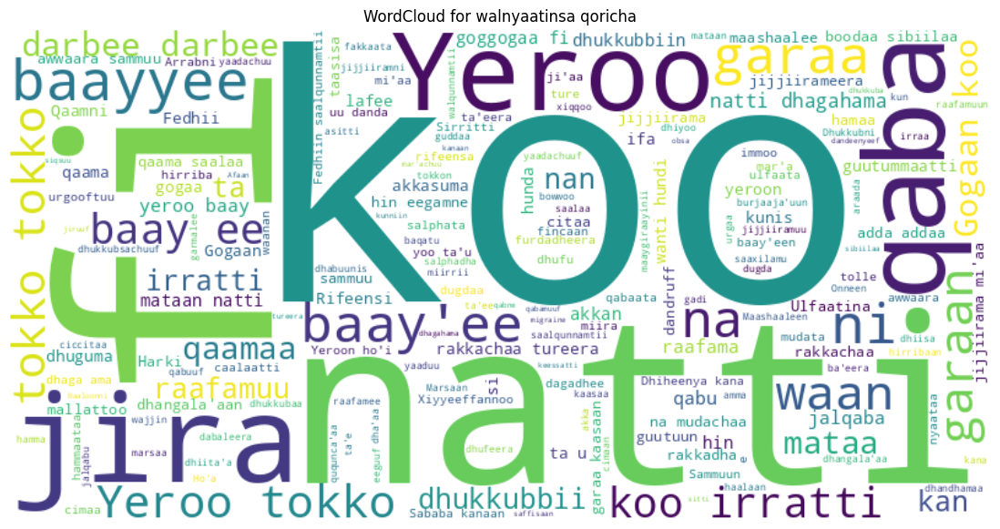

In [19]:
for cls in class_names:
    texts = " ".join(data[data['mallattoo itti gochuu']==cls]['barreeffama'])
    wordcloud = WordCloud(width=800, height=400, background_color='white', stopwords=stop_words).generate(texts)
    plt.figure(figsize=(15,7))
    plt.imshow(wordcloud, interpolation='bilinear')
    plt.axis('off')
    plt.title(f"WordCloud for {cls}")
    plt.show()

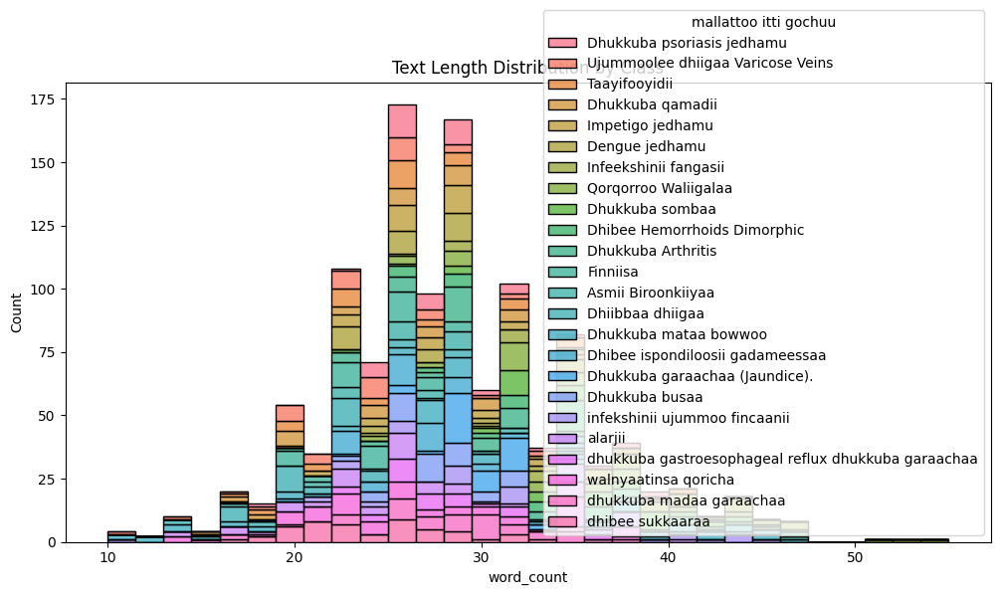

In [20]:
plt.figure(figsize=(12,6))
sns.histplot(data=data, x='word_count', hue='mallattoo itti gochuu', multiple='stack', bins=30)
plt.title("Text Length Distribution by Class")
plt.show()

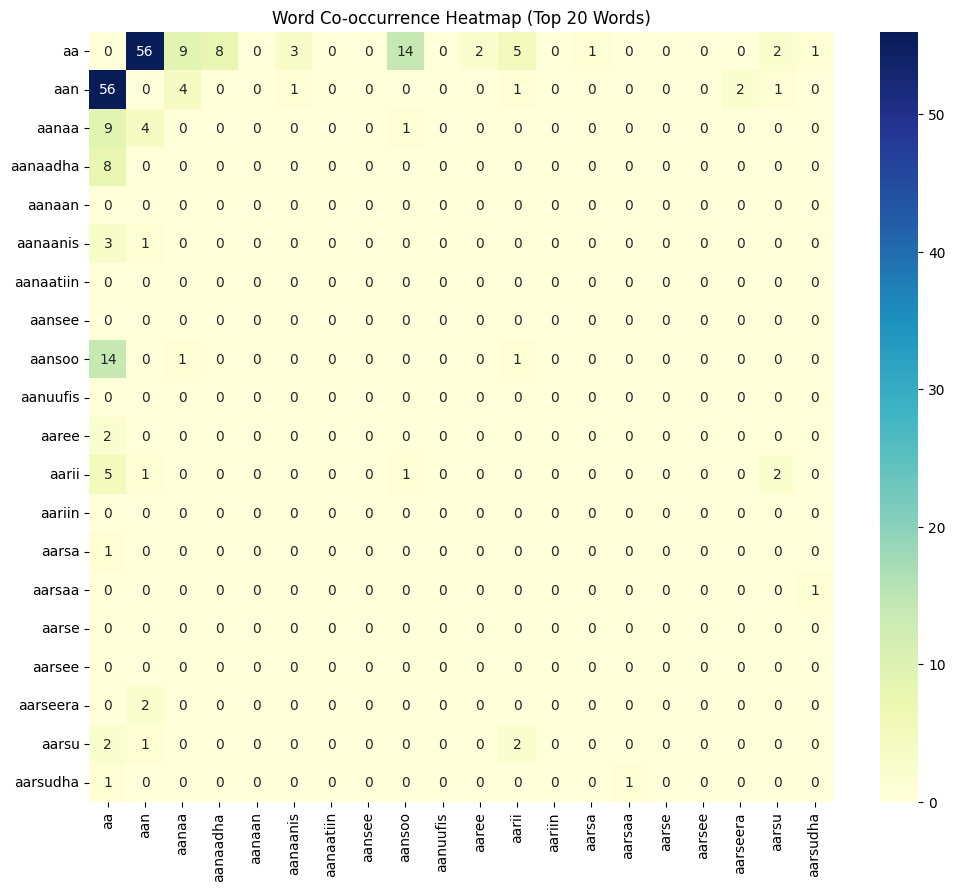

In [21]:
cv = CountVectorizer(stop_words='english')
X_cv = cv.fit_transform(data['barreeffama'])
co_occurrence = (X_cv.T @ X_cv).toarray()
np.fill_diagonal(co_occurrence, 0)
plt.figure(figsize=(12,10))
sns.heatmap(co_occurrence[:20,:20], annot=True, fmt="d", xticklabels=cv.get_feature_names_out()[:20], yticklabels=cv.get_feature_names_out()[:20], cmap="YlGnBu")
plt.title("Word Co-occurrence Heatmap (Top 20 Words)")
plt.show()

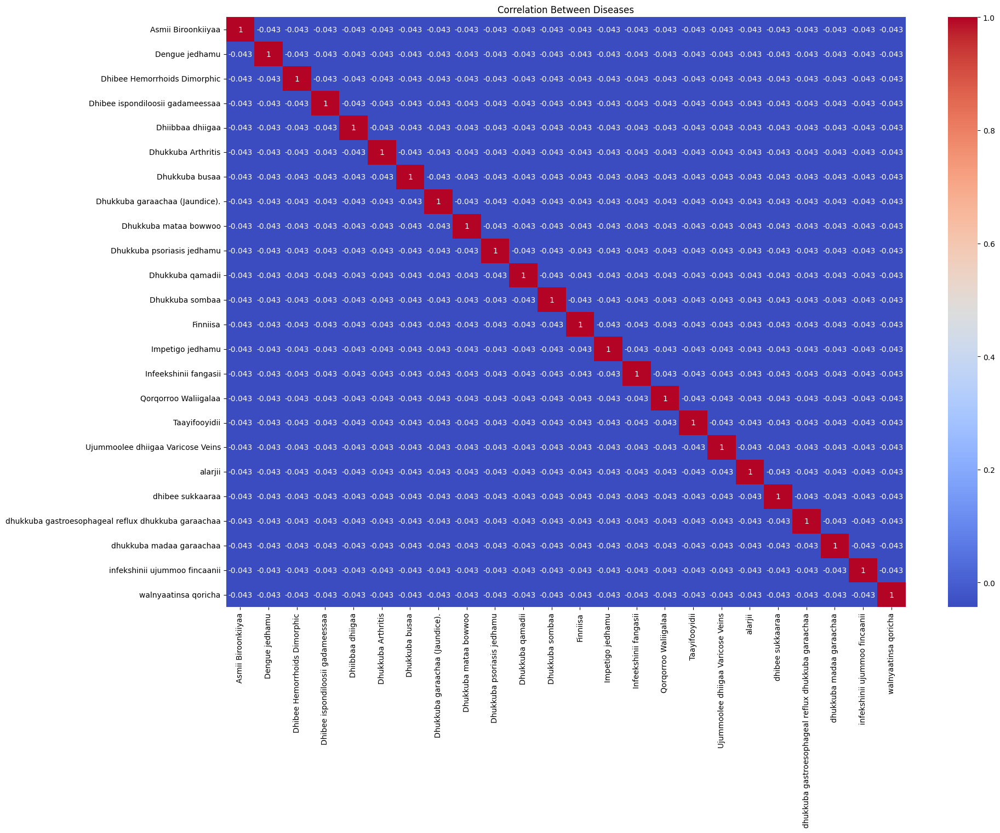

In [22]:
label_matrix = pd.get_dummies(data['mallattoo itti gochuu'])
corr = label_matrix.corr()
plt.figure(figsize=(20,14))
sns.heatmap(corr, annot=True, cmap='coolwarm')
plt.title("Correlation Between Diseases")
plt.show()

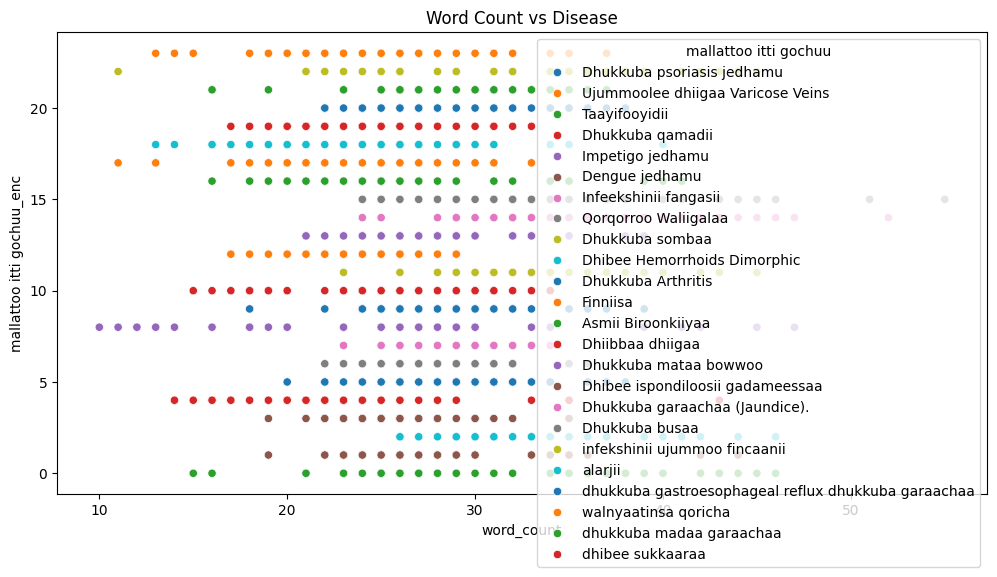

In [23]:
plt.figure(figsize=(12,6))
sns.scatterplot(x='word_count', y='mallattoo itti gochuu_enc', data=data, hue='mallattoo itti gochuu', palette='tab10')
plt.title("Word Count vs Disease")
plt.show()

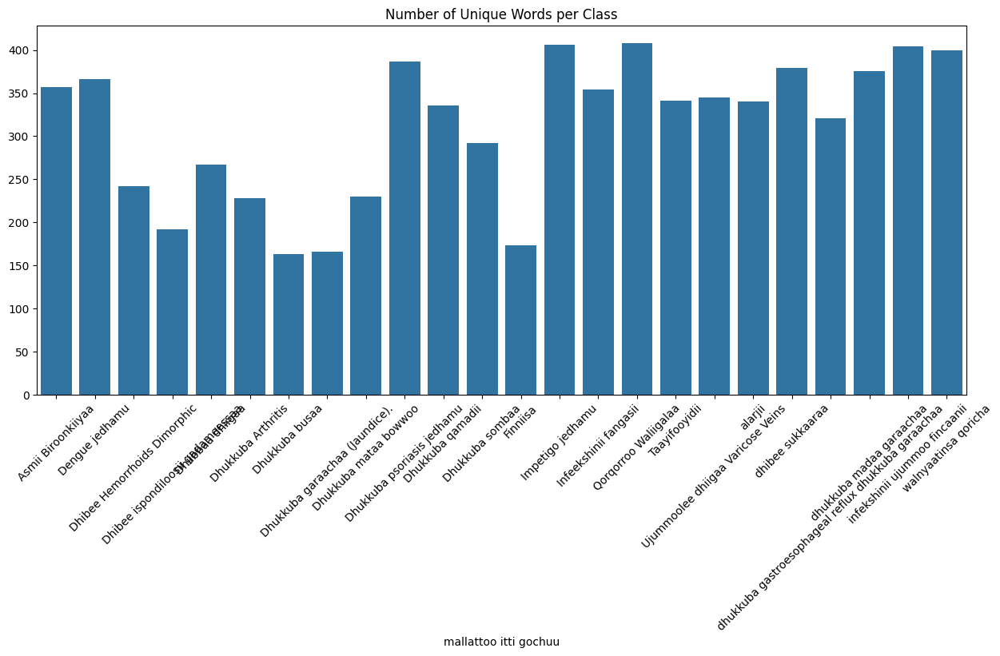

In [24]:
unique_words_per_class = data.groupby('mallattoo itti gochuu')['barreeffama'].apply(lambda x: len(set(chain.from_iterable([txt.split() for txt in x]))))
plt.figure(figsize=(15,6))
sns.barplot(x=unique_words_per_class.index, y=unique_words_per_class.values)
plt.title("Number of Unique Words per Class")
plt.xticks(rotation=45)
plt.show()

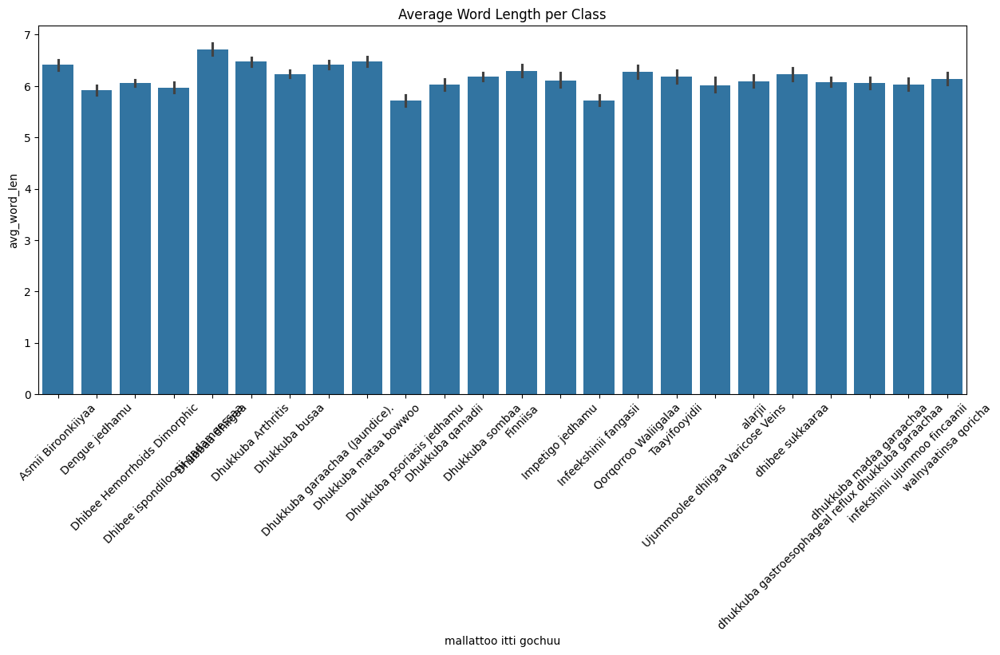

In [25]:
data['avg_word_len'] = data['barreeffama'].apply(lambda x: np.mean([len(w) for w in str(x).split()]))
plt.figure(figsize=(15,6))
sns.barplot(x='mallattoo itti gochuu', y='avg_word_len', data=data, order=class_names)
plt.title("Average Word Length per Class")
plt.xticks(rotation=45)
plt.show()

In [26]:
all_text = " ".join(data['barreeffama'].astype(str))

words = all_text.lower().split()

words = [w.strip(".,!?;:()[]") for w in words if w not in stop_words and len(w) > 1]

word_counts = Counter(words)

top_20 = word_counts.most_common(20)

print("Top 20 most frequently used words in the dataset:")
for word, freq in top_20:
    print(f"{word}: {freq}")

Top 20 most frequently used words in the dataset:
koo: 1538
fi: 1420
natti: 1195
na: 815
yeroo: 615
baay'ee: 499
ture: 465
jira: 455
garaa: 453
hin: 442
qaamaa: 398
kan: 392
tokko: 388
qaba: 386
koos: 329
irratti: 302
dhukkubbii: 295
dhuguma: 282
akkasumas: 277
tureera: 261


In [27]:
from sklearn.model_selection import train_test_split, cross_val_score
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.preprocessing import LabelEncoder
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix
from sklearn.linear_model import LogisticRegression
from sklearn.naive_bayes import MultinomialNB
from sklearn.svm import SVC
from sklearn.ensemble import RandomForestClassifier
from xgboost import XGBClassifier
import warnings
warnings.filterwarnings('ignore')

plt.style.use('seaborn-v0_8')
sns.set_palette("husl")

In [28]:
data = data.drop('Unnamed: 0', axis=1)

print("Missing values:")
print(data.isnull().sum())

Missing values:
mallattoo itti gochuu        0
barreeffama                  0
mallattoo itti gochuu_enc    0
word_count                   0
avg_word_len                 0
dtype: int64


In [29]:
import re
import string

def clean_text(barreeffama):
    barreeffama = barreeffama.lower()
    barreeffama = barreeffama.translate(str.maketrans('', '', string.punctuation))
    barreeffama = re.sub('\s+', ' ', barreeffama).strip()
    return barreeffama

data['cleaned_text'] = data['barreeffama'].apply(clean_text)
print("\nText cleaning completed.")


Text cleaning completed.


In [30]:
label_encoder = LabelEncoder()
data['label_encoded'] = label_encoder.fit_transform(data['mallattoo itti gochuu'])

tfidf = TfidfVectorizer(max_features=5000, stop_words='english', ngram_range=(1,2))
X = tfidf.fit_transform(data['cleaned_text']).toarray()
y = data['label_encoded']

print("Feature matrix shape:", X.shape)
print("Target variable shape:", y.shape)

Feature matrix shape: (1200, 5000)
Target variable shape: (1200,)


In [31]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42, stratify=y)

print("Training set size:", X_train.shape)
print("Testing set size:", X_test.shape)

Training set size: (960, 5000)
Testing set size: (240, 5000)


# Machine Learning Models

In [32]:
def evaluate_model(model, X_train, X_test, y_train, y_test, model_name):

    model.fit(X_train, y_train)

    y_pred = model.predict(X_test)

    accuracy = accuracy_score(y_test, y_pred)

    class_report = classification_report(y_test, y_pred, target_names=label_encoder.classes_, output_dict=True)

    cm = confusion_matrix(y_test, y_pred)

    cv_scores = cross_val_score(model, X_train, y_train, cv=5)

    return {
        'model': model,
        'model_name': model_name,
        'accuracy': accuracy,
        'classification_report': class_report,
        'confusion_matrix': cm,
        'cv_mean': cv_scores.mean(),
        'cv_std': cv_scores.std(),
        'predictions': y_pred
    }

In [33]:
models = {
    'Logistic Regression': LogisticRegression(random_state=42, max_iter=1000),
    'Multinomial Naive Bayes': MultinomialNB(),
    'Support Vector Machine': SVC(random_state=42, kernel='linear'),
    'Random Forest': RandomForestClassifier(random_state=42, n_estimators=100),
    'XGBoost': XGBClassifier(random_state=42, eval_metric='mlogloss')
}

In [34]:
results = {}

for model_name, model in models.items():
    print(f"\n{'='*50}")
    print(f"Training and Evaluating: {model_name}")
    print(f"{'='*50}")

    result = evaluate_model(model, X_train, X_test, y_train, y_test, model_name)
    results[model_name] = result

    print(f"Accuracy: {result['accuracy']:.4f}")
    print(f"Cross-validation Score: {result['cv_mean']:.4f} (+/- {result['cv_std']:.4f})")


Training and Evaluating: Logistic Regression
Accuracy: 0.9667
Cross-validation Score: 0.9281 (+/- 0.0101)

Training and Evaluating: Multinomial Naive Bayes
Accuracy: 0.9417
Cross-validation Score: 0.9208 (+/- 0.0090)

Training and Evaluating: Support Vector Machine
Accuracy: 0.9583
Cross-validation Score: 0.9594 (+/- 0.0083)

Training and Evaluating: Random Forest
Accuracy: 0.8792
Cross-validation Score: 0.8812 (+/- 0.0222)

Training and Evaluating: XGBoost
Accuracy: 0.7875
Cross-validation Score: 0.8094 (+/- 0.0194)



COMPREHENSIVE RESULTS FOR LOGISTIC REGRESSION

Accuracy: 0.9667
5-Fold Cross Validation: 0.9281 (+/- 0.0101)

Classification Report:
                                                     precision    recall  f1-score   support

                                 Asmii Biroonkiiyaa       1.00      1.00      1.00        10
                                     Dengue jedhamu       0.82      0.90      0.86        10
                       Dhibee Hemorrhoids Dimorphic       1.00      1.00      1.00        10
                   Dhibee ispondiloosii gadameessaa       0.91      1.00      0.95        10
                                   Dhiibbaa dhiigaa       1.00      1.00      1.00        10
                                 Dhukkuba Arthritis       1.00      1.00      1.00        10
                                     Dhukkuba busaa       1.00      1.00      1.00        10
                     Dhukkuba garaachaa (Jaundice).       1.00      1.00      1.00        10
                            

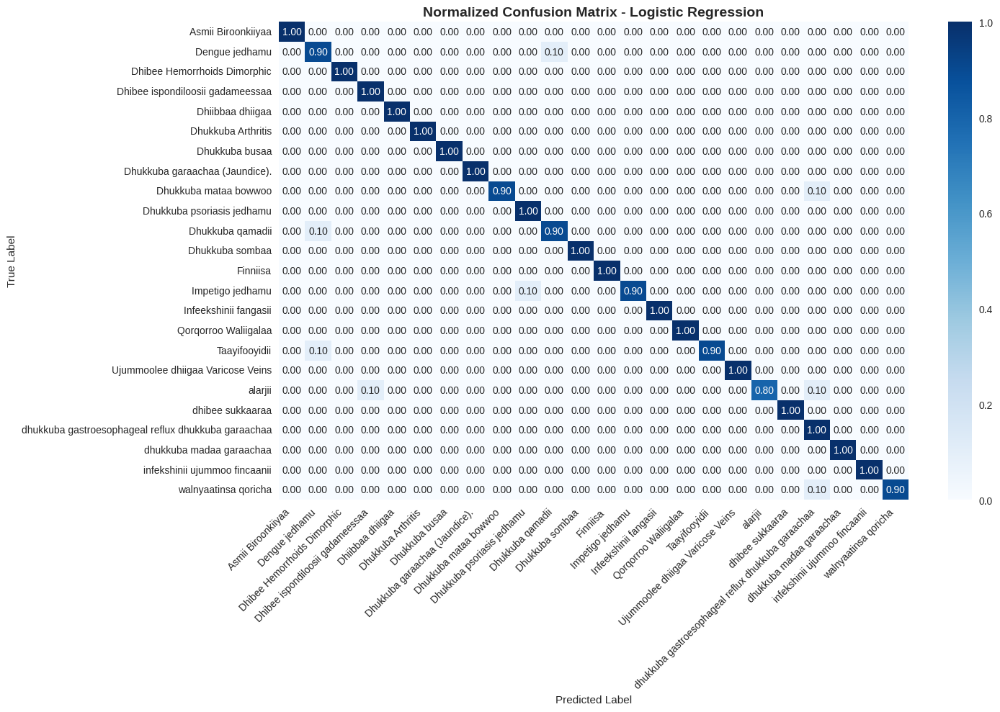


COMPREHENSIVE RESULTS FOR MULTINOMIAL NAIVE BAYES

Accuracy: 0.9417
5-Fold Cross Validation: 0.9208 (+/- 0.0090)

Classification Report:
                                                     precision    recall  f1-score   support

                                 Asmii Biroonkiiyaa       1.00      1.00      1.00        10
                                     Dengue jedhamu       0.78      0.70      0.74        10
                       Dhibee Hemorrhoids Dimorphic       0.91      1.00      0.95        10
                   Dhibee ispondiloosii gadameessaa       0.91      1.00      0.95        10
                                   Dhiibbaa dhiigaa       1.00      1.00      1.00        10
                                 Dhukkuba Arthritis       1.00      1.00      1.00        10
                                     Dhukkuba busaa       0.83      1.00      0.91        10
                     Dhukkuba garaachaa (Jaundice).       1.00      1.00      1.00        10
                        

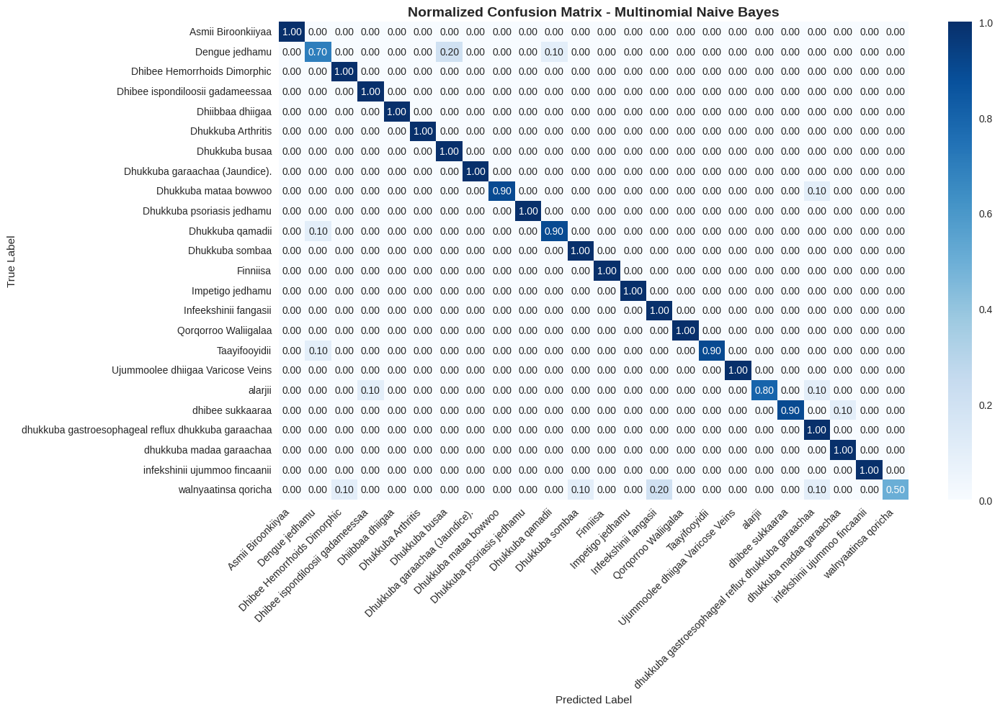


COMPREHENSIVE RESULTS FOR SUPPORT VECTOR MACHINE

Accuracy: 0.9583
5-Fold Cross Validation: 0.9594 (+/- 0.0083)

Classification Report:
                                                     precision    recall  f1-score   support

                                 Asmii Biroonkiiyaa       1.00      0.90      0.95        10
                                     Dengue jedhamu       0.82      0.90      0.86        10
                       Dhibee Hemorrhoids Dimorphic       1.00      1.00      1.00        10
                   Dhibee ispondiloosii gadameessaa       1.00      1.00      1.00        10
                                   Dhiibbaa dhiigaa       1.00      1.00      1.00        10
                                 Dhukkuba Arthritis       1.00      1.00      1.00        10
                                     Dhukkuba busaa       1.00      1.00      1.00        10
                     Dhukkuba garaachaa (Jaundice).       1.00      1.00      1.00        10
                         

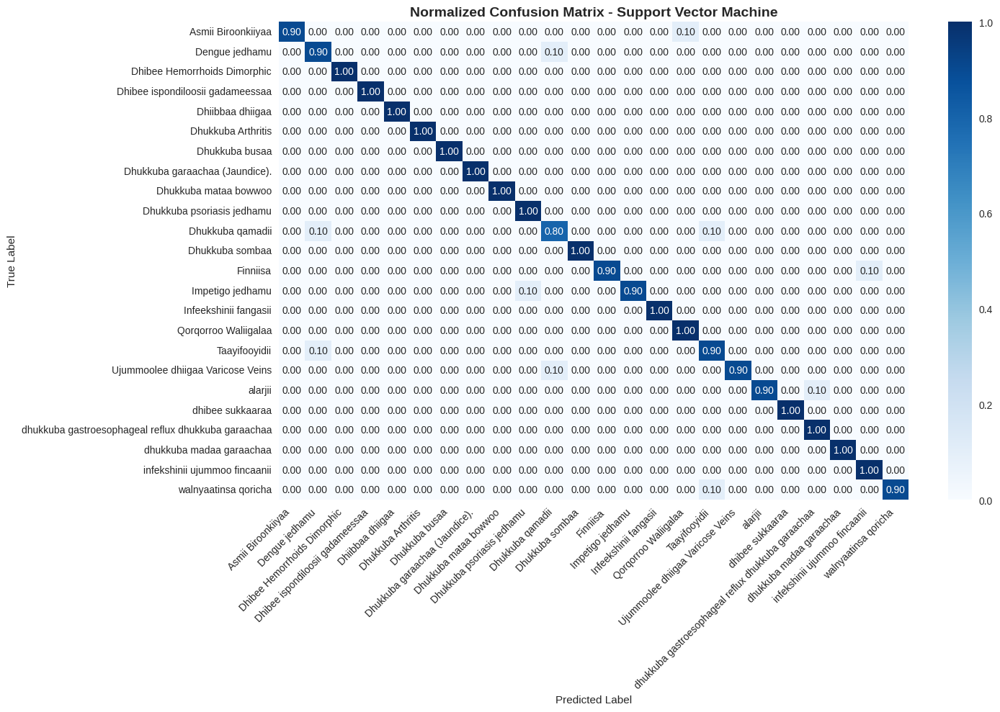


COMPREHENSIVE RESULTS FOR RANDOM FOREST

Accuracy: 0.8792
5-Fold Cross Validation: 0.8812 (+/- 0.0222)

Classification Report:
                                                     precision    recall  f1-score   support

                                 Asmii Biroonkiiyaa       0.91      1.00      0.95        10
                                     Dengue jedhamu       0.57      0.40      0.47        10
                       Dhibee Hemorrhoids Dimorphic       0.91      1.00      0.95        10
                   Dhibee ispondiloosii gadameessaa       1.00      1.00      1.00        10
                                   Dhiibbaa dhiigaa       0.91      1.00      0.95        10
                                 Dhukkuba Arthritis       0.91      1.00      0.95        10
                                     Dhukkuba busaa       0.91      1.00      0.95        10
                     Dhukkuba garaachaa (Jaundice).       1.00      1.00      1.00        10
                              Dhuk

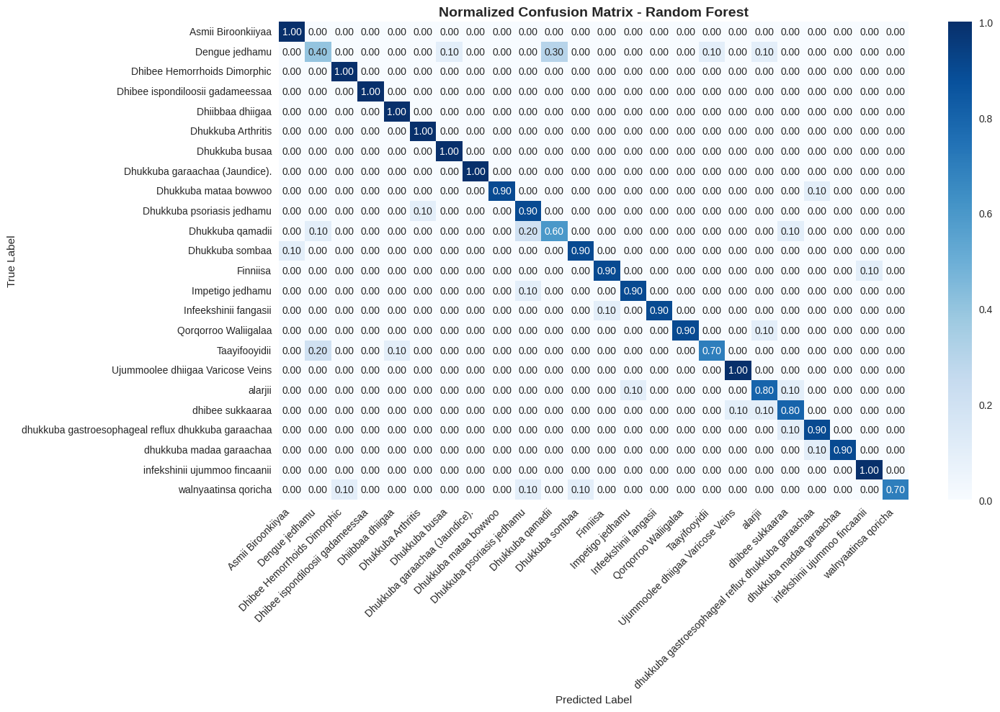


COMPREHENSIVE RESULTS FOR XGBOOST

Accuracy: 0.7875
5-Fold Cross Validation: 0.8094 (+/- 0.0194)

Classification Report:
                                                     precision    recall  f1-score   support

                                 Asmii Biroonkiiyaa       0.67      0.60      0.63        10
                                     Dengue jedhamu       0.60      0.60      0.60        10
                       Dhibee Hemorrhoids Dimorphic       0.77      1.00      0.87        10
                   Dhibee ispondiloosii gadameessaa       0.83      1.00      0.91        10
                                   Dhiibbaa dhiigaa       0.91      1.00      0.95        10
                                 Dhukkuba Arthritis       0.91      1.00      0.95        10
                                     Dhukkuba busaa       1.00      0.90      0.95        10
                     Dhukkuba garaachaa (Jaundice).       1.00      1.00      1.00        10
                              Dhukkuba m

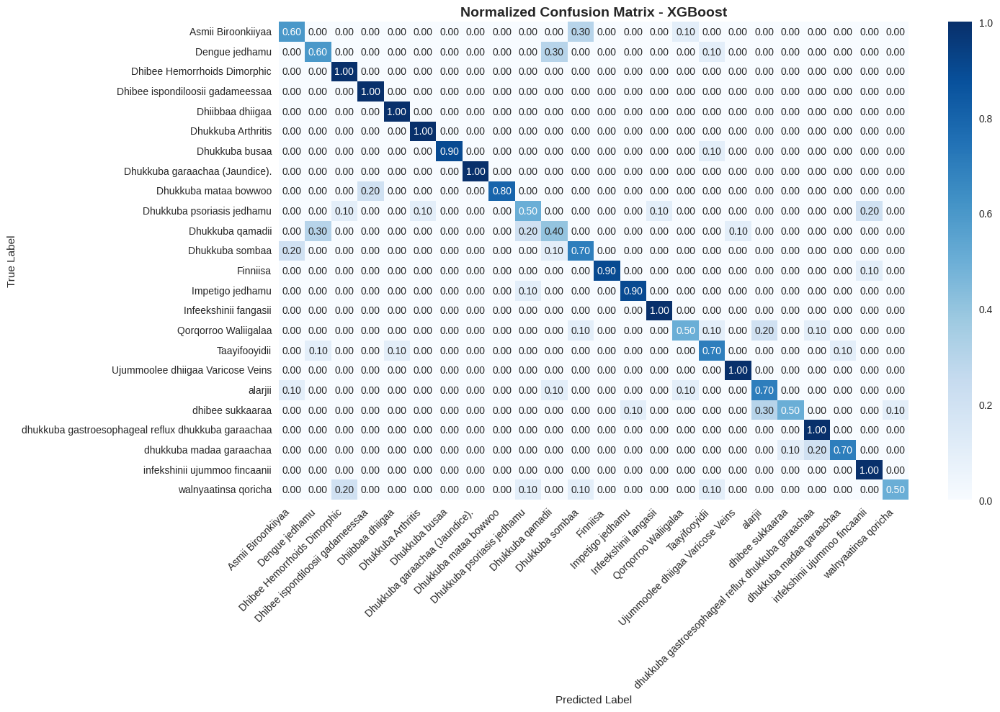

In [35]:
for model_name, result in results.items():
    print(f"\n{'='*60}")
    print(f"COMPREHENSIVE RESULTS FOR {model_name.upper()}")
    print(f"{'='*60}")

    print(f"\nAccuracy: {result['accuracy']:.4f}")
    print(f"5-Fold Cross Validation: {result['cv_mean']:.4f} (+/- {result['cv_std']:.4f})")

    print(f"\nClassification Report:")
    print(classification_report(y_test, result['predictions'],
                              target_names=label_encoder.classes_))

    plt.figure(figsize=(15, 10))
    cm_normalized = result['confusion_matrix'].astype('float') / result['confusion_matrix'].sum(axis=1)[:, np.newaxis]

    sns.heatmap(cm_normalized, annot=True, fmt='.2f', cmap='Blues',
                xticklabels=label_encoder.classes_,
                yticklabels=label_encoder.classes_)
    plt.title(f'Normalized Confusion Matrix - {model_name}', fontsize=14, fontweight='bold')
    plt.xlabel('Predicted Label')
    plt.ylabel('True Label')
    plt.xticks(rotation=45, ha='right')
    plt.yticks(rotation=0)
    plt.tight_layout()
    plt.show()


COMPARATIVE ANALYSIS OF ALL MODELS
                     Model  Accuracy  CV_Mean  CV_Std
0      Logistic Regression    0.9667   0.9281  0.0101
2   Support Vector Machine    0.9583   0.9594  0.0083
1  Multinomial Naive Bayes    0.9417   0.9208  0.0090
3            Random Forest    0.8792   0.8812  0.0222
4                  XGBoost    0.7875   0.8094  0.0194


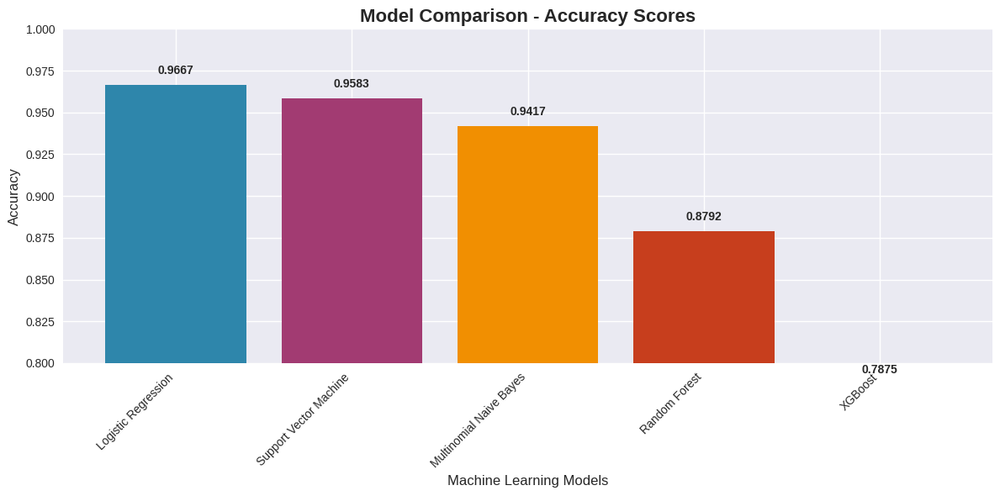

In [36]:
print("\n" + "="*70)
print("COMPARATIVE ANALYSIS OF ALL MODELS")
print("="*70)

comparison_df = pd.DataFrame({
    'Model': [result['model_name'] for result in results.values()],
    'Accuracy': [result['accuracy'] for result in results.values()],
    'CV_Mean': [result['cv_mean'] for result in results.values()],
    'CV_Std': [result['cv_std'] for result in results.values()]
}).sort_values('Accuracy', ascending=False)

print(comparison_df.round(4))

plt.figure(figsize=(12, 6))
models_list = comparison_df['Model'].values
accuracies = comparison_df['Accuracy'].values

bars = plt.bar(models_list, accuracies, color=['#2E86AB', '#A23B72', '#F18F01', '#C73E1D', '#3B1F2B'])
plt.title('Model Comparison - Accuracy Scores', fontsize=16, fontweight='bold')
plt.xlabel('Machine Learning Models', fontsize=12)
plt.ylabel('Accuracy', fontsize=12)
plt.ylim(0.8, 1.0)
plt.xticks(rotation=45, ha='right')

for bar, accuracy in zip(bars, accuracies):
    plt.text(bar.get_x() + bar.get_width()/2, bar.get_height() + 0.005,
             f'{accuracy:.4f}', ha='center', va='bottom', fontweight='bold')

plt.tight_layout()
plt.show()

In [37]:
print("\n" + "="*70)
print("STATISTICAL ANALYSIS")
print("="*70)

from scipy.stats import friedmanchisquare

cv_scores_matrix = []
for model_name in models.keys():
    model = models[model_name]
    cv_scores = cross_val_score(model, X, y, cv=5)
    cv_scores_matrix.append(cv_scores)

stat, p_value = friedmanchisquare(*cv_scores_matrix)
print(f"Friedman Test Statistic: {stat:.4f}")
print(f"P-value: {p_value:.4f}")

if p_value < 0.05:
    print("There are significant differences between the models (p < 0.05).")
else:
    print("No significant differences between the models (p >= 0.05).")


STATISTICAL ANALYSIS
Friedman Test Statistic: 19.1111
P-value: 0.0007
There are significant differences between the models (p < 0.05).



FEATURE IMPORTANCE ANALYSIS
Top 20 Important Features (Random Forest):
 1. qaamaa               0.008971
 2. gogaan               0.008037
 3. fincaan              0.007729
 4. koo                  0.007180
 5. garaa                0.007073
 6. guutame              0.006899
 7. fi                   0.006687
 8. fincaan koo          0.006250
 9. hafuura              0.005892
10. madaan               0.005847
11. yeroo                0.005812
12. garaa kaasaa         0.005793
13. dhukkubbii           0.005688
14. natti                0.005644
15. qufaa                0.005608
16. na                   0.005336
17. keelloo              0.005268
18. saalaa               0.005262
19. dugdaa               0.005231
20. mataa dhukkubbii     0.005006


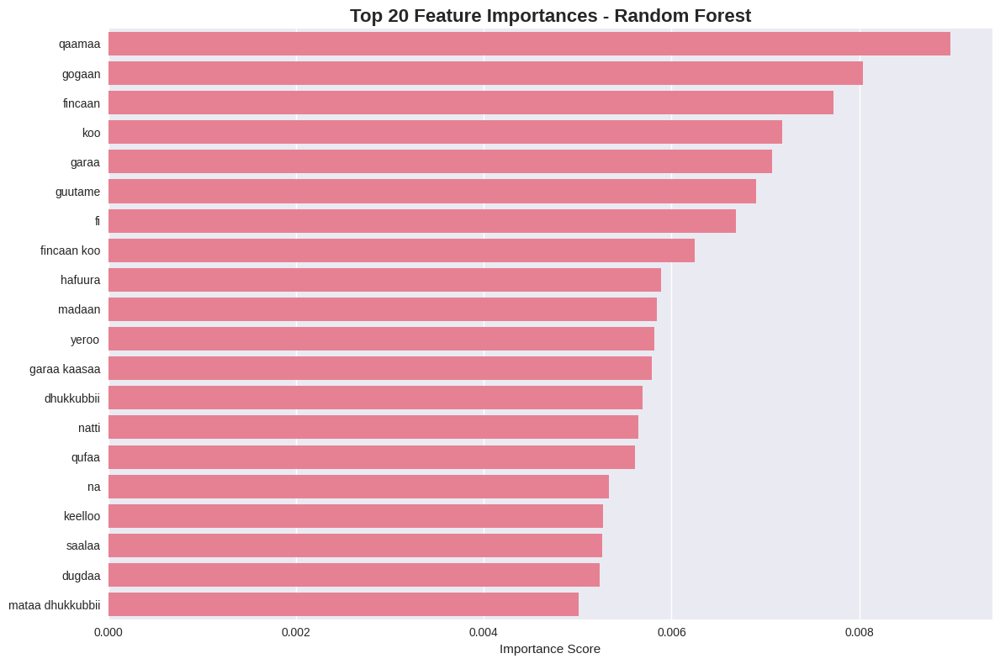

In [38]:
print("\n" + "="*70)
print("FEATURE IMPORTANCE ANALYSIS")
print("="*70)

feature_names = tfidf.get_feature_names_out()

rf_model = results['Random Forest']['model']
importances = rf_model.feature_importances_

indices = np.argsort(importances)[::-1][:20]

print("Top 20 Important Features (Random Forest):")
for i, idx in enumerate(indices):
    print(f"{i+1:2d}. {feature_names[idx]:20s} {importances[idx]:.6f}")

plt.figure(figsize=(12, 8))
sns.barplot(x=importances[indices], y=[feature_names[i] for i in indices])
plt.title('Top 20 Feature Importances - Random Forest', fontsize=16, fontweight='bold')
plt.xlabel('Importance Score')
plt.tight_layout()
plt.show()

In [39]:
print("\n" + "="*80)
print("FINAL SUMMARY TABLE FOR THESIS RESEARCH")
print("="*80)

summary_data = []
for model_name, result in results.items():
    report = result['classification_report']
    macro_avg = report['macro avg']

    summary_data.append({
        'Model': model_name,
        'Accuracy': f"{result['accuracy']:.4f}",
        'Precision (Macro)': f"{macro_avg['precision']:.4f}",
        'Recall (Macro)': f"{macro_avg['recall']:.4f}",
        'F1-Score (Macro)': f"{macro_avg['f1-score']:.4f}",
        'CV Score (Mean)': f"{result['cv_mean']:.4f}",
        'CV Score (Std)': f"{result['cv_std']:.4f}"
    })

summary_df = pd.DataFrame(summary_data)
print(summary_df.to_string(index=False))



FINAL SUMMARY TABLE FOR THESIS RESEARCH
                  Model Accuracy Precision (Macro) Recall (Macro) F1-Score (Macro) CV Score (Mean) CV Score (Std)
    Logistic Regression   0.9667            0.9711         0.9667           0.9671          0.9281         0.0101
Multinomial Naive Bayes   0.9417            0.9479         0.9417           0.9388          0.9208         0.0090
 Support Vector Machine   0.9583            0.9614         0.9583           0.9587          0.9594         0.0083
          Random Forest   0.8792            0.8809         0.8792           0.8760          0.8812         0.0222
                XGBoost   0.7875            0.7918         0.7875           0.7811          0.8094         0.0194


# Deep Learning Models

In [40]:
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Dropout, Embedding, LSTM, Conv1D, GlobalMaxPooling1D, Bidirectional
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.utils import to_categorical
from tensorflow.keras.preprocessing.text import Tokenizer
from tensorflow.keras.preprocessing.sequence import pad_sequences
from sklearn.utils.class_weight import compute_class_weight
import warnings
warnings.filterwarnings('ignore')

tf.random.set_seed(42)
np.random.seed(42)

In [41]:
X_text_train, X_text_test, y_train, y_test = train_test_split(
    data['cleaned_text'], data['label_encoded'],
    test_size=0.2, random_state=42, stratify=data['label_encoded']
)

y_train_categorical = to_categorical(y_train)
y_test_categorical = to_categorical(y_test)

num_classes = len(np.unique(y_train))
print(f"Number of classes: {num_classes}")

Number of classes: 24


In [42]:
max_words = 5000
max_len = 100

tokenizer = Tokenizer(num_words=max_words, oov_token='<OOV>')
tokenizer.fit_on_texts(X_text_train)

X_train_seq = tokenizer.texts_to_sequences(X_text_train)
X_test_seq = tokenizer.texts_to_sequences(X_text_test)

X_train_padded = pad_sequences(X_train_seq, maxlen=max_len, padding='post')
X_test_padded = pad_sequences(X_test_seq, maxlen=max_len, padding='post')

print("Training sequences shape:", X_train_padded.shape)
print("Testing sequences shape:", X_test_padded.shape)

Training sequences shape: (960, 100)
Testing sequences shape: (240, 100)


In [43]:
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Embedding, Conv1D, GlobalMaxPooling1D, Dense, Dropout
from tensorflow.keras.optimizers import Adam

def create_cnn_model(vocab_size, max_length, num_classes):
    model = Sequential([
        Embedding(input_dim=vocab_size, output_dim=100, input_shape=(max_length,)),
        Conv1D(128, 5, activation='relu'),
        GlobalMaxPooling1D(),
        Dense(128, activation='relu'),
        Dropout(0.5),
        Dense(64, activation='relu'),
        Dropout(0.3),
        Dense(num_classes, activation='softmax')
    ])

    model.compile(
        optimizer=Adam(learning_rate=0.001),
        loss='categorical_crossentropy',
        metrics=['accuracy']
    )

    return model


max_words = 5000
max_len = 100
num_classes = 5

cnn_model = create_cnn_model(max_words, max_len, num_classes)

cnn_model.build(input_shape=(None, max_len))

print("CNN Model Architecture:")
cnn_model.summary()

CNN Model Architecture:


Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ embedding (Embedding)           │ (None, 100, 100)       │       500,000 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv1d (Conv1D)                 │ (None, 96, 128)        │        64,128 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ global_max_pooling1d            │ (None, 128)            │             0 │
│ (GlobalMaxPooling1D)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 128)            │        16,512 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ (None, 128)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 64)             │         8,256 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_1 (Dropout)             │ (None, 64)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2 (Dense)                 │ (None, 5)              │           325 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 589,221 (2.25 MB)

 Trainable params: 589,221 (2.25 MB)

 Non-trainable params: 0 (0.00 B)

In [44]:
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Embedding, LSTM, Bidirectional, Dense, Dropout
from tensorflow.keras.optimizers import Adam

def create_lstm_model(vocab_size, max_length, num_classes):
    model = Sequential([
        Embedding(input_dim=vocab_size, output_dim=100, input_shape=(max_length,)),
        Bidirectional(LSTM(64, return_sequences=True)),
        Dropout(0.3),
        Bidirectional(LSTM(32)),
        Dropout(0.3),
        Dense(64, activation='relu'),
        Dropout(0.2),
        Dense(num_classes, activation='softmax')
    ])

    model.compile(
        optimizer=Adam(learning_rate=0.001),
        loss='categorical_crossentropy',
        metrics=['accuracy']
    )

    return model



max_words = 5000
max_len = 100
num_classes = 5

lstm_model = create_lstm_model(max_words, max_len, num_classes)

lstm_model.build(input_shape=(None, max_len))

print("LSTM Model Architecture:")
lstm_model.summary()


LSTM Model Architecture:


Model: "sequential_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ embedding_1 (Embedding)         │ (None, 100, 100)       │       500,000 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ bidirectional (Bidirectional)   │ (None, 100, 128)       │        84,480 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_2 (Dropout)             │ (None, 100, 128)       │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ bidirectional_1 (Bidirectional) │ (None, 64)             │        41,216 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_3 (Dropout)             │ (None, 64)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3 (Dense)                 │ (None, 64)             │         4,160 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_4 (Dropout)             │ (None, 64)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4 (Dense)                 │ (None, 5)              │           325 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 630,181 (2.40 MB)

 Trainable params: 630,181 (2.40 MB)

 Non-trainable params: 0 (0.00 B)

In [45]:
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Embedding, Conv1D, LSTM, Bidirectional, GlobalMaxPooling1D, Dense, Dropout
from tensorflow.keras.optimizers import Adam

def create_hybrid_model(vocab_size, max_length, num_classes):
    model = Sequential([
        Embedding(input_dim=vocab_size, output_dim=100, input_shape=(max_length,)),
        Conv1D(64, 3, activation='relu'),
        Conv1D(128, 3, activation='relu'),
        Bidirectional(LSTM(64, return_sequences=True)),
        GlobalMaxPooling1D(),
        Dense(128, activation='relu'),
        Dropout(0.4),
        Dense(64, activation='relu'),
        Dropout(0.3),
        Dense(num_classes, activation='softmax')
    ])

    model.compile(
        optimizer=Adam(learning_rate=0.0005),
        loss='categorical_crossentropy',
        metrics=['accuracy']
    )

    return model


max_words = 5000
max_len = 100
num_classes = 5

hybrid_model = create_hybrid_model(max_words, max_len, num_classes)

hybrid_model.build(input_shape=(None, max_len))

print("✅ Hybrid CNN-LSTM Model Architecture:")
hybrid_model.summary()


✅ Hybrid CNN-LSTM Model Architecture:


Model: "sequential_2"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ embedding_2 (Embedding)         │ (None, 100, 100)       │       500,000 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv1d_1 (Conv1D)               │ (None, 98, 64)         │        19,264 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv1d_2 (Conv1D)               │ (None, 96, 128)        │        24,704 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ bidirectional_2 (Bidirectional) │ (None, 96, 128)        │        98,816 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ global_max_pooling1d_1          │ (None, 128)            │             0 │
│ (GlobalMaxPooling1D)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5 (Dense)                 │ (None, 128)            │        16,512 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_5 (Dropout)             │ (None, 128)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_6 (Dense)                 │ (None, 64)             │         8,256 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_6 (Dropout)             │ (None, 64)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_7 (Dense)                 │ (None, 5)              │           325 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 667,877 (2.55 MB)

 Trainable params: 667,877 (2.55 MB)

 Non-trainable params: 0 (0.00 B)

In [46]:
from sklearn.utils.class_weight import compute_class_weight
from sklearn.metrics import classification_report, confusion_matrix
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

def evaluate_dl_model(model, X_train, X_test, y_train, y_test, model_name,
                      epochs=15, batch_size=32):

    if len(y_train.shape) > 1 and y_train.shape[1] > 1:
        y_train_int = np.argmax(y_train, axis=1)
        y_test_int = np.argmax(y_test, axis=1)
    else:
        y_train_int = y_train
        y_test_int = y_test

    class_weights = compute_class_weight(
        class_weight='balanced',
        classes=np.unique(y_train_int),
        y=y_train_int
    )
    class_weights = dict(enumerate(class_weights))

    history = model.fit(
        X_train, y_train,
        validation_data=(X_test, y_test),
        epochs=epochs,
        batch_size=batch_size,
        class_weight=class_weights,
        verbose=1
    )

    loss, accuracy = model.evaluate(X_test, y_test, verbose=0)

    y_pred_probs = model.predict(X_test, verbose=0)
    y_pred = np.argmax(y_pred_probs, axis=1)
    y_true = np.argmax(y_test, axis=1) if len(y_test.shape) > 1 else y_test

    cm = confusion_matrix(y_true, y_pred)

    return {
        "loss": loss,
        "accuracy": accuracy,
        "history": history.history,
        "true_labels": y_true,
        "predictions": y_pred,
        "confusion_matrix": cm
    }

In [47]:
num_classes = y_train_categorical.shape[1]
print("✅ Detected number of classes:", num_classes)

✅ Detected number of classes: 24


In [48]:
dl_models = {
    'CNN': create_cnn_model(max_words, max_len, num_classes),
    'LSTM': create_lstm_model(max_words, max_len, num_classes),
    'Hybrid_CNN_LSTM': create_hybrid_model(max_words, max_len, num_classes)
}

dl_results = {}

for model_name, model in dl_models.items():
    print(f"\n{'='*50}")
    print(f"Training and Evaluating: {model_name}")
    print(f"{'='*50}")

    result = evaluate_dl_model(
        model,
        X_train_padded, X_test_padded,
        y_train_categorical, y_test_categorical,
        model_name
    )
    dl_results[model_name] = result

    print(f"✅ {model_name} Accuracy: {result['accuracy']:.4f}")


Training and Evaluating: CNN
Epoch 1/15
30/30 ━━━━━━━━━━━━━━━━━━━━ 8s 98ms/step - accuracy: 0.0357 - loss: 3.1824 - val_accuracy: 0.0958 - val_loss: 3.1608
Epoch 2/15
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step - accuracy: 0.0706 - loss: 3.1483 - val_accuracy: 0.1875 - val_loss: 3.1033
Epoch 3/15
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.1620 - loss: 3.0704 - val_accuracy: 0.2375 - val_loss: 2.9297
Epoch 4/15
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.2344 - loss: 2.8341 - val_accuracy: 0.3542 - val_loss: 2.4290
Epoch 5/15
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - accuracy: 0.3324 - loss: 2.3380 - val_accuracy: 0.5875 - val_loss: 1.7243
Epoch 6/15
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step - accuracy: 0.5206 - loss: 1.7223 - val_accuracy: 0.7500 - val_loss: 1.2111
Epoch 7/15
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - accuracy: 0.6156 - loss: 1.2945 - val_accuracy: 0.8208 - val_loss: 0.9209
Epoch 8/15
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - accuracy: 0.6993 - loss: 0.995

✅ Hybrid_CNN_LSTM Accuracy: 0.5792



COMPREHENSIVE RESULTS FOR CNN

Accuracy: 0.8917

Classification Report:
                                                     precision    recall  f1-score   support

                                 Asmii Biroonkiiyaa       0.90      0.90      0.90        10
                                     Dengue jedhamu       1.00      0.70      0.82        10
                       Dhibee Hemorrhoids Dimorphic       0.91      1.00      0.95        10
                   Dhibee ispondiloosii gadameessaa       1.00      1.00      1.00        10
                                   Dhiibbaa dhiigaa       0.83      1.00      0.91        10
                                 Dhukkuba Arthritis       0.91      1.00      0.95        10
                                     Dhukkuba busaa       0.91      1.00      0.95        10
                     Dhukkuba garaachaa (Jaundice).       1.00      1.00      1.00        10
                              Dhukkuba mataa bowwoo       0.90      0.90      0.90       

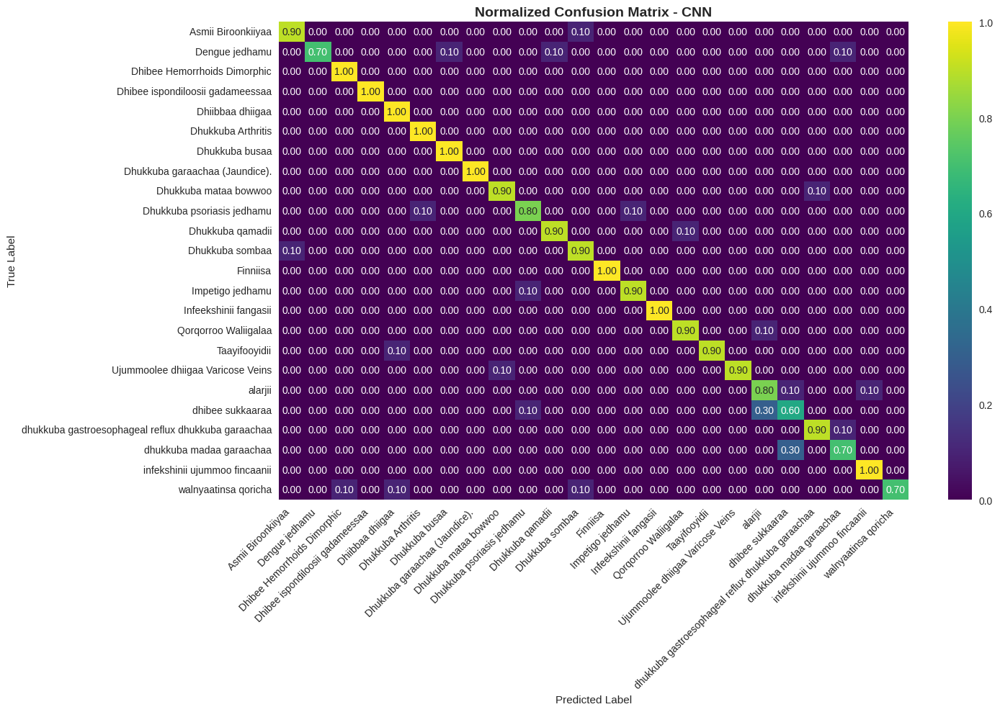


COMPREHENSIVE RESULTS FOR LSTM

Accuracy: 0.7708

Classification Report:
                                                     precision    recall  f1-score   support

                                 Asmii Biroonkiiyaa       1.00      0.30      0.46        10
                                     Dengue jedhamu       0.50      0.40      0.44        10
                       Dhibee Hemorrhoids Dimorphic       0.89      0.80      0.84        10
                   Dhibee ispondiloosii gadameessaa       1.00      1.00      1.00        10
                                   Dhiibbaa dhiigaa       0.90      0.90      0.90        10
                                 Dhukkuba Arthritis       1.00      1.00      1.00        10
                                     Dhukkuba busaa       0.91      1.00      0.95        10
                     Dhukkuba garaachaa (Jaundice).       1.00      1.00      1.00        10
                              Dhukkuba mataa bowwoo       1.00      0.70      0.82      

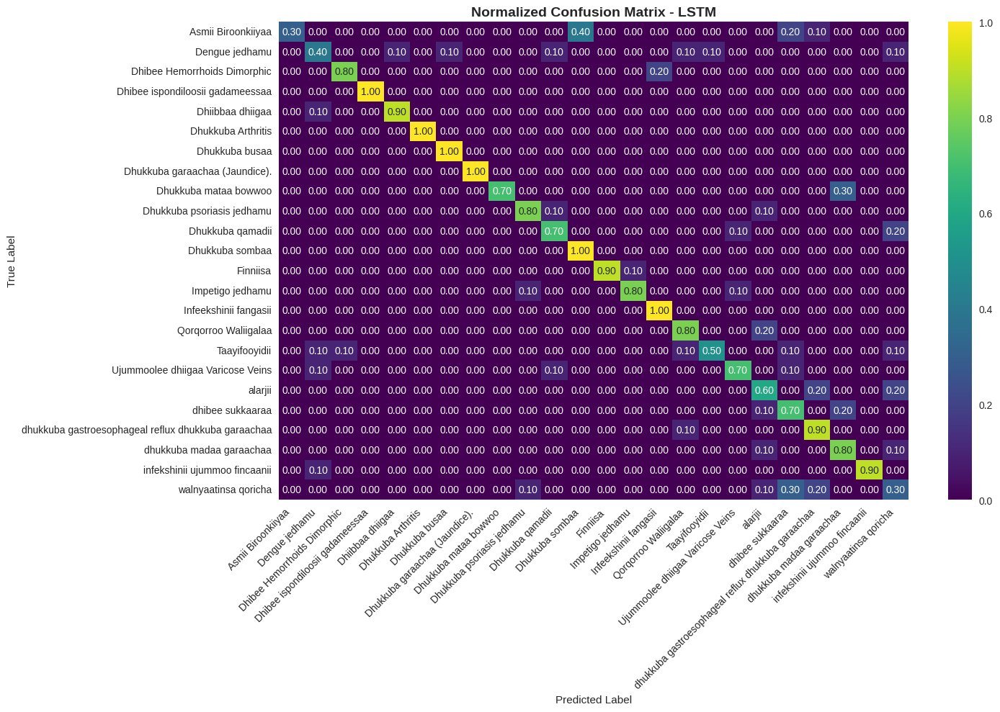


COMPREHENSIVE RESULTS FOR HYBRID_CNN_LSTM

Accuracy: 0.5792

Classification Report:
                                                     precision    recall  f1-score   support

                                 Asmii Biroonkiiyaa       0.78      0.70      0.74        10
                                     Dengue jedhamu       0.00      0.00      0.00        10
                       Dhibee Hemorrhoids Dimorphic       0.83      1.00      0.91        10
                   Dhibee ispondiloosii gadameessaa       0.75      0.90      0.82        10
                                   Dhiibbaa dhiigaa       0.71      1.00      0.83        10
                                 Dhukkuba Arthritis       0.82      0.90      0.86        10
                                     Dhukkuba busaa       1.00      1.00      1.00        10
                     Dhukkuba garaachaa (Jaundice).       0.62      1.00      0.77        10
                              Dhukkuba mataa bowwoo       0.90      0.90     

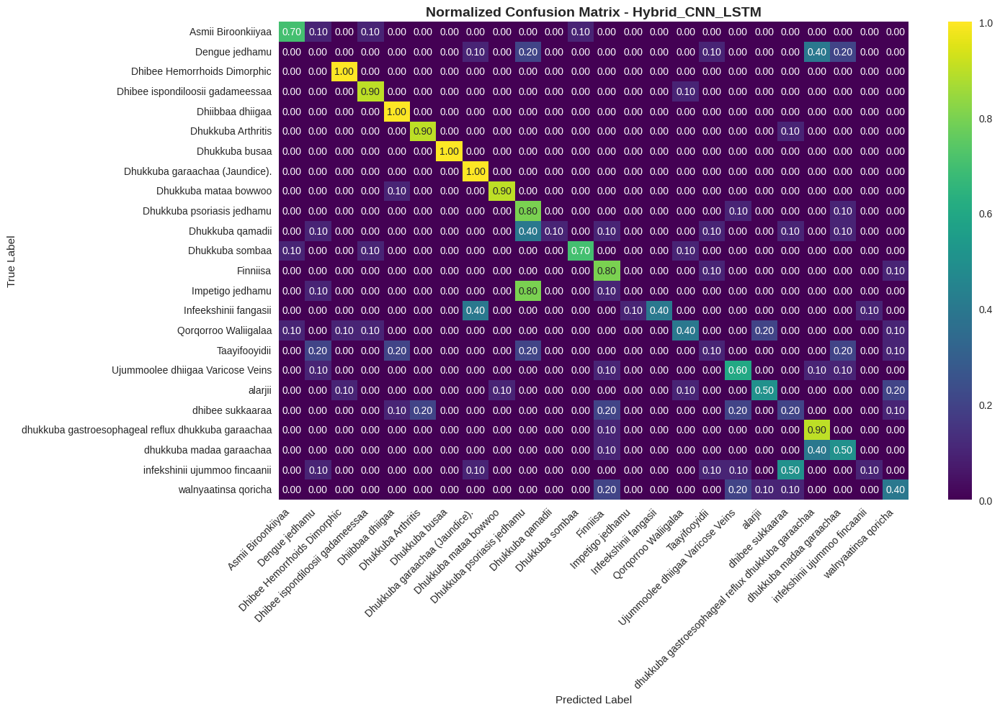

In [49]:
for model_name, result in dl_results.items():
    print(f"\n{'='*60}")
    print(f"COMPREHENSIVE RESULTS FOR {model_name.upper()}")
    print(f"{'='*60}")

    print(f"\nAccuracy: {result['accuracy']:.4f}")

    print(f"\nClassification Report:")
    print(classification_report(result["true_labels"], result["predictions"],
                                target_names=label_encoder.classes_))

    plt.figure(figsize=(15, 10))
    cm_normalized = result["confusion_matrix"].astype("float") / result["confusion_matrix"].sum(axis=1)[:, np.newaxis]

    sns.heatmap(cm_normalized, annot=True, fmt=".2f", cmap="viridis",
                xticklabels=label_encoder.classes_,
                yticklabels=label_encoder.classes_)
    plt.title(f"Normalized Confusion Matrix - {model_name}", fontsize=14, fontweight="bold")
    plt.xlabel("Predicted Label")
    plt.ylabel("True Label")
    plt.xticks(rotation=45, ha="right")
    plt.yticks(rotation=0)
    plt.tight_layout()
    plt.show()

In [50]:
from sklearn.metrics import classification_report

for model_name, result in dl_results.items():
    report = classification_report(
        result["true_labels"],
        result["predictions"],
        target_names=label_encoder.classes_,
        output_dict=True
    )
    dl_results[model_name]['classification_report'] = report

print("\n" + "="*80)
print("COMPREHENSIVE COMPARISON: TRADITIONAL ML vs DEEP LEARNING MODELS")
print("="*80)

all_results = {**results, **dl_results}

comparison_data = []
for model_name, result in all_results.items():
    macro_avg = result['classification_report']['macro avg']
    model_type = 'Deep Learning' if model_name in dl_results else 'Traditional ML'

    comparison_data.append({
        'Model Type': model_type,
        'Model': model_name,
        'Accuracy': f"{result['accuracy']:.4f}",
        'Precision': f"{macro_avg['precision']:.4f}",
        'Recall': f"{macro_avg['recall']:.4f}",
        'F1-Score': f"{macro_avg['f1-score']:.4f}"
    })

comparison_df = pd.DataFrame(comparison_data)
comparison_df = comparison_df.sort_values('Accuracy', ascending=False)

from IPython.display import display, Markdown
display(Markdown("### Comprehensive Model Comparison"))
display(comparison_df)



COMPREHENSIVE COMPARISON: TRADITIONAL ML vs DEEP LEARNING MODELS


### Comprehensive Model Comparison

,Model Type,Model,Accuracy,Precision,Recall,F1-Score
0,Traditional ML,Logistic Regression,0.9667,0.9711,0.9667,0.9671
2,Traditional ML,Support Vector Machine,0.9583,0.9614,0.9583,0.9587
1,Traditional ML,Multinomial Naive Bayes,0.9417,0.9479,0.9417,0.9388
5,Deep Learning,CNN,0.8917,0.8972,0.8917,0.8909
3,Traditional ML,Random Forest,0.8792,0.8809,0.8792,0.8760
4,Traditional ML,XGBoost,0.7875,0.7918,0.7875,0.7811
6,Deep Learning,LSTM,0.7708,0.7930,0.7708,0.7667
7,Deep Learning,Hybrid_CNN_LSTM,0.5792,0.5838,0.5792,0.5411


In [51]:
print("\n" + "="*90)
print("FINAL COMPREHENSIVE SUMMARY TABLE FOR THESIS RESEARCH")
print("="*90)

final_summary_data = []

for model_name, result in results.items():
    macro_avg = result['classification_report']['macro avg']
    final_summary_data.append({
        'Model Type': 'Traditional ML',
        'Model': model_name,
        'Accuracy': f"{result['accuracy']:.4f}",
        'Precision': f"{macro_avg['precision']:.4f}",
        'Recall': f"{macro_avg['recall']:.4f}",
        'F1-Score': f"{macro_avg['f1-score']:.4f}",
        'CV Score': f"{result['cv_mean']:.4f} ± {result['cv_std']:.4f}"
    })

for model_name, result in dl_results.items():
    macro_avg = result['classification_report']['macro avg']
    final_summary_data.append({
        'Model Type': 'Deep Learning',
        'Model': model_name,
        'Accuracy': f"{result['accuracy']:.4f}",
        'Precision': f"{macro_avg['precision']:.4f}",
        'Recall': f"{macro_avg['recall']:.4f}",
        'F1-Score': f"{macro_avg['f1-score']:.4f}",
        'CV Score': 'N/A (DL)'
    })

final_summary_df = pd.DataFrame(final_summary_data)
final_summary_df = final_summary_df.sort_values('Accuracy', ascending=False)
print(final_summary_df.to_string(index=False))



FINAL COMPREHENSIVE SUMMARY TABLE FOR THESIS RESEARCH
    Model Type                   Model Accuracy Precision Recall F1-Score        CV Score
Traditional ML     Logistic Regression   0.9667    0.9711 0.9667   0.9671 0.9281 ± 0.0101
Traditional ML  Support Vector Machine   0.9583    0.9614 0.9583   0.9587 0.9594 ± 0.0083
Traditional ML Multinomial Naive Bayes   0.9417    0.9479 0.9417   0.9388 0.9208 ± 0.0090
 Deep Learning                     CNN   0.8917    0.8972 0.8917   0.8909        N/A (DL)
Traditional ML           Random Forest   0.8792    0.8809 0.8792   0.8760 0.8812 ± 0.0222
Traditional ML                 XGBoost   0.7875    0.7918 0.7875   0.7811 0.8094 ± 0.0194
 Deep Learning                    LSTM   0.7708    0.7930 0.7708   0.7667        N/A (DL)
 Deep Learning         Hybrid_CNN_LSTM   0.5792    0.5838 0.5792   0.5411        N/A (DL)


# Transformer Model

In [52]:
!pip install lime

In [53]:
import torch
from torch.utils.data import Dataset, DataLoader
from transformers import AutoTokenizer, AutoModelForSequenceClassification, get_linear_schedule_with_warmup
from torch.optim import AdamW
from lime.lime_text import LimeTextExplainer
import warnings
warnings.filterwarnings('ignore')

In [54]:
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print(f"Using device: {device}")

model_name = 'bert-base-uncased'
num_classes = len(label_encoder.classes_)
max_length = 128
batch_size = 16
epochs = 5
learning_rate = 2e-5

Using device: cuda


In [55]:

tokenizer = AutoTokenizer.from_pretrained(model_name)


X_text_train, X_text_test, y_train, y_test = train_test_split(
    data['cleaned_text'], data['label_encoded'],
    test_size=0.2, random_state=42, stratify=data['label_encoded']
)


def tokenize_texts(texts, labels):
    encodings = tokenizer(
        texts.tolist(),
        truncation=True,
        padding=True,
        max_length=max_length,
        return_tensors='pt'
    )
    return {
        'input_ids': encodings['input_ids'],
        'attention_mask': encodings['attention_mask'],
        'labels': torch.tensor(labels.tolist(), dtype=torch.long)
    }

train_encodings = tokenize_texts(X_text_train, y_train)
test_encodings = tokenize_texts(X_text_test, y_test)

print("Data tokenization completed!")

tokenizer_config.json:   0%|          | 0.00/48.0 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/570 [00:00<?, ?B/s]

vocab.txt:   0%|          | 0.00/232k [00:00<?, ?B/s]

tokenizer.json:   0%|          | 0.00/466k [00:00<?, ?B/s]

Data tokenization completed!


In [56]:
class SimpleDataset(torch.utils.data.Dataset):
    def __init__(self, encodings):
        self.encodings = encodings

    def __getitem__(self, idx):
        return {key: val[idx] for key, val in self.encodings.items()}

    def __len__(self):
        return len(self.encodings['input_ids'])

train_dataset = SimpleDataset(train_encodings)
test_dataset = SimpleDataset(test_encodings)

train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True)
test_loader = DataLoader(test_dataset, batch_size=batch_size, shuffle=False)

print(f"Training batches: {len(train_loader)}")
print(f"Test batches: {len(test_loader)}")

Training batches: 60
Test batches: 15


In [57]:
model = AutoModelForSequenceClassification.from_pretrained(
    model_name,
    num_labels=num_classes
)
model.to(device)

optimizer = AdamW(model.parameters(), lr=learning_rate)
total_steps = len(train_loader) * epochs
scheduler = get_linear_schedule_with_warmup(
    optimizer,
    num_warmup_steps=0,
    num_training_steps=total_steps
)

print("BERT model loaded and ready for fine-tuning!")
print(f"Number of parameters: {sum(p.numel() for p in model.parameters()):,}")

model.safetensors:   0%|          | 0.00/440M [00:00<?, ?B/s]

Some weights of BertForSequenceClassification were not initialized from the model checkpoint at bert-base-uncased and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


BERT model loaded and ready for fine-tuning!
Number of parameters: 109,500,696


In [58]:
def fine_tune_bert(model, train_loader, test_loader, epochs):
    training_stats = []

    for epoch in range(epochs):
        print(f'\nEpoch {epoch + 1}/{epochs}')
        print('-' * 50)

        model.train()
        total_train_loss = 0
        train_correct = 0
        train_total = 0

        for batch in train_loader:
            input_ids = batch['input_ids'].to(device)
            attention_mask = batch['attention_mask'].to(device)
            labels = batch['labels'].to(device)

            optimizer.zero_grad()

            outputs = model(input_ids, attention_mask=attention_mask, labels=labels)
            loss = outputs.loss

            loss.backward()
            torch.nn.utils.clip_grad_norm_(model.parameters(), 1.0)
            optimizer.step()
            scheduler.step()

            total_train_loss += loss.item()
            logits = outputs.logits
            predictions = torch.argmax(logits, dim=1)
            train_correct += (predictions == labels).sum().item()
            train_total += labels.size(0)

        avg_train_loss = total_train_loss / len(train_loader)
        train_accuracy = train_correct / train_total

        avg_val_loss, val_accuracy = evaluate_bert(model, test_loader)

        print(f'Training Loss: {avg_train_loss:.4f}, Accuracy: {train_accuracy:.4f}')
        print(f'Validation Loss: {avg_val_loss:.4f}, Accuracy: {val_accuracy:.4f}')

        training_stats.append({
            'epoch': epoch + 1,
            'train_loss': avg_train_loss,
            'train_accuracy': train_accuracy,
            'val_loss': avg_val_loss,
            'val_accuracy': val_accuracy
        })

    return training_stats

def evaluate_bert(model, dataloader):
    model.eval()
    total_loss = 0
    correct = 0
    total = 0

    with torch.no_grad():
        for batch in dataloader:
            input_ids = batch['input_ids'].to(device)
            attention_mask = batch['attention_mask'].to(device)
            labels = batch['labels'].to(device)

            outputs = model(input_ids, attention_mask=attention_mask, labels=labels)
            loss = outputs.loss
            total_loss += loss.item()

            logits = outputs.logits
            predictions = torch.argmax(logits, dim=1)
            correct += (predictions == labels).sum().item()
            total += labels.size(0)

    avg_loss = total_loss / len(dataloader)
    accuracy = correct / total

    return avg_loss, accuracy

print("Starting BERT fine-tuning...")
training_stats = fine_tune_bert(model, train_loader, test_loader, epochs)

Starting BERT fine-tuning...

Epoch 1/5
--------------------------------------------------
Training Loss: 3.1714, Accuracy: 0.0563
Validation Loss: 3.0616, Accuracy: 0.1333

Epoch 2/5
--------------------------------------------------
Training Loss: 2.8792, Accuracy: 0.2625
Validation Loss: 2.6184, Accuracy: 0.4208

Epoch 3/5
--------------------------------------------------
Training Loss: 2.4622, Accuracy: 0.5260
Validation Loss: 2.2833, Accuracy: 0.5625

Epoch 4/5
--------------------------------------------------
Training Loss: 2.1598, Accuracy: 0.6552
Validation Loss: 2.0627, Accuracy: 0.6333

Epoch 5/5
--------------------------------------------------
Training Loss: 2.0042, Accuracy: 0.7115
Validation Loss: 1.9929, Accuracy: 0.6500



BERT MODEL EVALUATION
Accuracy: 0.6500

Classification Report:
                                                     precision    recall  f1-score   support

                                 Asmii Biroonkiiyaa       0.71      1.00      0.83        10
                                     Dengue jedhamu       0.33      0.10      0.15        10
                       Dhibee Hemorrhoids Dimorphic       0.53      1.00      0.69        10
                   Dhibee ispondiloosii gadameessaa       0.75      0.90      0.82        10
                                   Dhiibbaa dhiigaa       0.67      1.00      0.80        10
                                 Dhukkuba Arthritis       0.77      1.00      0.87        10
                                     Dhukkuba busaa       0.64      0.90      0.75        10
                     Dhukkuba garaachaa (Jaundice).       0.91      1.00      0.95        10
                              Dhukkuba mataa bowwoo       0.83      1.00      0.91        10
     

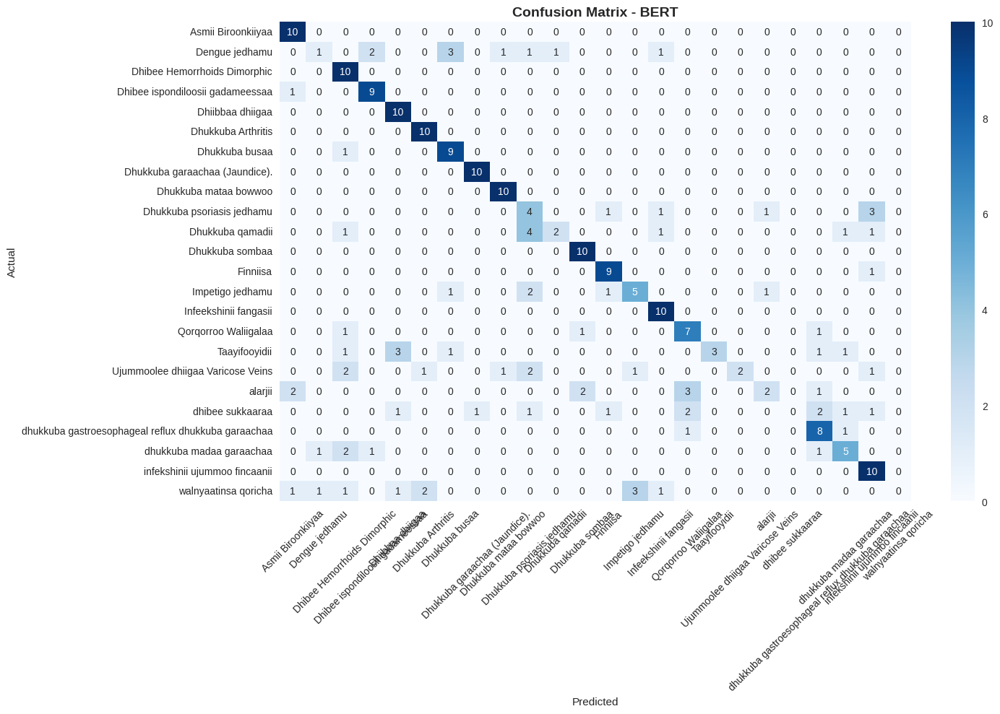

In [59]:
def predict_bert(texts):
    model.eval()
    predictions = []
    probabilities = []

    with torch.no_grad():
        for text in texts:
            encoding = tokenizer(
                text,
                truncation=True,
                padding=True,
                max_length=max_length,
                return_tensors='pt'
            )

            input_ids = encoding['input_ids'].to(device)
            attention_mask = encoding['attention_mask'].to(device)

            outputs = model(input_ids, attention_mask=attention_mask)
            logits = outputs.logits
            probs = torch.softmax(logits, dim=1)
            pred = torch.argmax(logits, dim=1)

            predictions.append(pred.cpu().item())
            probabilities.append(probs.cpu().numpy())

    return predictions, probabilities

test_texts = X_text_test.tolist()
y_true = y_test.tolist()
y_pred, y_probs = predict_bert(test_texts)

bert_accuracy = accuracy_score(y_true, y_pred)

print("\n" + "="*60)
print("BERT MODEL EVALUATION")
print("="*60)
print(f"Accuracy: {bert_accuracy:.4f}")

print("\nClassification Report:")
print(classification_report(y_true, y_pred, target_names=label_encoder.classes_))

cm = confusion_matrix(y_true, y_pred)
plt.figure(figsize=(15, 10))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues',
            xticklabels=label_encoder.classes_,
            yticklabels=label_encoder.classes_)
plt.title('Confusion Matrix - BERT', fontsize=14, fontweight='bold')
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.xticks(rotation=45)
plt.yticks(rotation=0)
plt.tight_layout()
plt.show()

bert_results = {
    'model_name': 'BERT',
    'accuracy': bert_accuracy,
    'classification_report': classification_report(y_true, y_pred,
                                                  target_names=label_encoder.classes_,
                                                  output_dict=True),
    'confusion_matrix': cm,
    'predictions': y_pred,
    'true_labels': y_true
}

In [61]:
all_results['BERT'] = bert_results

comparison_data = []
for model_name, result in all_results.items():
    if 'classification_report' in result:
        report = result['classification_report']
        accuracy = result['accuracy']

        if 'macro avg' in report:
            precision = report['macro avg']['precision']
            recall = report['macro avg']['recall']
            f1 = report['macro avg']['f1-score']
        else:
            precision = recall = f1 = 0.0

        if model_name in ['CNN', 'LSTM', 'Hybrid_CNN_LSTM']:
            model_type = 'Deep Learning'
        elif model_name == 'BERT':
            model_type = 'Transformer'
        else:
            model_type = 'Traditional ML'

        comparison_data.append({
            'Model Type': model_type,
            'Model': model_name,
            'Accuracy': f"{accuracy:.4f}",
            'Precision': f"{precision:.4f}",
            'Recall': f"{recall:.4f}",
            'F1-Score': f"{f1:.4f}"
        })

comparison_df = pd.DataFrame(comparison_data)
comparison_df = comparison_df.sort_values('Accuracy', ascending=False)

print("\n" + "="*80)
print("COMPREHENSIVE MODEL COMPARISON (9 MODELS)")
print("="*80)
print(comparison_df.to_string(index=False))


COMPREHENSIVE MODEL COMPARISON (9 MODELS)
    Model Type                   Model Accuracy Precision Recall F1-Score
Traditional ML     Logistic Regression   0.9667    0.9711 0.9667   0.9671
Traditional ML  Support Vector Machine   0.9583    0.9614 0.9583   0.9587
Traditional ML Multinomial Naive Bayes   0.9417    0.9479 0.9417   0.9388
 Deep Learning                     CNN   0.8917    0.8972 0.8917   0.8909
Traditional ML           Random Forest   0.8792    0.8809 0.8792   0.8760
Traditional ML                 XGBoost   0.7875    0.7918 0.7875   0.7811
 Deep Learning                    LSTM   0.7708    0.7930 0.7708   0.7667
   Transformer                    BERT   0.6500    0.6100 0.6500   0.5870
 Deep Learning         Hybrid_CNN_LSTM   0.5792    0.5838 0.5792   0.5411
